In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import tensorflow as tf
tf.VERSION


'1.15.0'

In [2]:
#To import InstanceNormalization from keras-contrib
!pip install git+https://www.github.com/keras-team/keras-contrib.git

  Cloning https://www.github.com/keras-team/keras-contrib.git to /tmp/pip-req-build-u25brilo
  Running command git clone -q https://www.github.com/keras-team/keras-contrib.git /tmp/pip-req-build-u25brilo
  Created wheel for keras-contrib: filename=keras_contrib-2.0.8-cp36-none-any.whl size=101064 sha256=643b998340586c82d0922c5874a685e3b53f330fa813caf6873f48646f769c54
  Stored in directory: /tmp/pip-ephem-wheel-cache-80893b8z/wheels/11/27/c8/4ed56de7b55f4f61244e2dc6ef3cdbaff2692527a2ce6502ba
Successfully built keras-contrib


**Generator with U-Net Architecture**                              
**Discriminator**                                                               
**Combined Network**

In [0]:
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization

import sys
import numpy as np
import os
import warnings
warnings.filterwarnings("ignore")


# Input shape
img_rows = 256
img_cols = 256
channels = 1
img_shape = (img_rows, img_cols, channels)

# Calculate output shape of D (PatchGAN)
patch = int(img_rows/2**4)
disc_patch = (patch, patch, 1)

# Loss weights
lambda_cycle = 10.0               # Cycle-consistency loss
lambda_id = 0.1 * lambda_cycle    # Identity loss

#Optimizer
optimizer = Adam(0.0002, 0.5)

def Generator():
  """Generator foloows U-Net Architecture"""

  # Image input
  inputs = Input(shape=img_shape)

  # Downsampling
  conv1 = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(inputs)
  conv1 = LeakyReLU(alpha=0.2)(conv1)
  conv1 = InstanceNormalization()(conv1)

  conv2 = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(conv1)
  conv2 = LeakyReLU(alpha=0.2)(conv2)
  conv2 = InstanceNormalization()(conv2)

  conv3 = Conv2D(filters=256, kernel_size=4, strides=2, padding='same')(conv2)
  conv3 = LeakyReLU(alpha=0.2)(conv3)
  conv3 = InstanceNormalization()(conv3)

  conv4 = Conv2D(filters=512, kernel_size=4, strides=2, padding='same')(conv3)
  conv4 = LeakyReLU(alpha=0.2)(conv4)
  conv4 = InstanceNormalization()(conv4)

  conv5 = Conv2D(filters=512, kernel_size=4, strides=2, padding='same')(conv4)
  conv5 = LeakyReLU(alpha=0.2)(conv5)
  conv5 = InstanceNormalization()(conv5)

  conv6 = Conv2D(filters=512, kernel_size=4, strides=2, padding='same')(conv5)
  conv6 = LeakyReLU(alpha=0.2)(conv6)
  conv6 = InstanceNormalization()(conv6)

  conv7 = Conv2D(filters=512, kernel_size=4, strides=2, padding='same')(conv6)
  conv7 = LeakyReLU(alpha=0.2)(conv7)
  conv7 = InstanceNormalization()(conv7)

  # Upsampling
  deconv1 = UpSampling2D(size=2)(conv7)
  deconv1 = Conv2D(filters=512, kernel_size=4, strides=1, padding='same', activation='relu')(deconv1)
  deconv1 = InstanceNormalization()(deconv1)
  deconv1 = Concatenate()([deconv1, conv6])

  deconv2 = UpSampling2D(size=2)(deconv1)
  deconv2 = Conv2D(filters=512, kernel_size=4, strides=1, padding='same', activation='relu')(deconv2)
  deconv2 = InstanceNormalization()(deconv2)
  deconv2 = Concatenate()([deconv2, conv5])

  deconv3 = UpSampling2D(size=2)(deconv2)
  deconv3 = Conv2D(filters=512, kernel_size=4, strides=1, padding='same', activation='relu')(deconv3)
  deconv3 = InstanceNormalization()(deconv3)
  deconv3 = Concatenate()([deconv3, conv4])

  deconv4 = UpSampling2D(size=2)(deconv3)
  deconv4 = Conv2D(filters=256, kernel_size=4, strides=1, padding='same', activation='relu')(deconv4)
  deconv4 = InstanceNormalization()(deconv4)
  deconv4 = Concatenate()([deconv4, conv3])

  deconv5 = UpSampling2D(size=2)(deconv4)
  deconv5 = Conv2D(filters=128, kernel_size=4, strides=1, padding='same', activation='relu')(deconv5)
  deconv5 = InstanceNormalization()(deconv5)
  deconv5 = Concatenate()([deconv5, conv2])

  deconv6 = UpSampling2D(size=2)(deconv5)
  deconv6 = Conv2D(filters=64, kernel_size=4, strides=1, padding='same', activation='relu')(deconv6)
  deconv6 = InstanceNormalization()(deconv6)
  deconv6 = Concatenate()([deconv6, conv1])

  deconv7 = UpSampling2D(size=2)(deconv6)
  outputs = Conv2D(channels, kernel_size=4, strides=1, padding='same', activation='tanh')(deconv7)

  return Model(inputs = inputs, outputs = outputs)


def Discriminator():
  inputs = Input(shape=img_shape)

  outputs = Conv2D(filters=64, kernel_size=4, strides=2, padding='same')(inputs)
  outputs = LeakyReLU(alpha=0.2)(outputs)

  outputs = Conv2D(filters=128, kernel_size=4, strides=2, padding='same')(outputs)
  outputs = LeakyReLU(alpha=0.2)(outputs)
  outputs = InstanceNormalization()(outputs)

  outputs = Conv2D(filters=256, kernel_size=4, strides=2, padding='same')(outputs)
  outputs = LeakyReLU(alpha=0.2)(outputs)
  outputs = InstanceNormalization()(outputs)

  outputs = Conv2D(filters=512, kernel_size=4, strides=2, padding='same')(outputs)
  outputs = LeakyReLU(alpha=0.2)(outputs)
  outputs = InstanceNormalization()(outputs)
  
  outputs = Conv2D(1, kernel_size=4, strides=1, padding='same')(outputs)

  return Model(inputs = inputs, outputs = outputs)


# Build and compile the discriminators
D_A = Discriminator()
D_A.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])
print(D_A.summary())

D_B = Discriminator()
D_B.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

#-------------------------
# Construct Computational
#   Graph of Generators
#-------------------------

# Build the generators
G_AB = Generator()
print(G_AB.summary())
G_BA = Generator()

# Input images from both domains
img_A = Input(shape=img_shape)
img_B = Input(shape=img_shape)

# Translate images to the other domain
fake_B = G_AB(img_A)
fake_A = G_BA(img_B)
# Translate images back to original domain
reconstr_A = G_BA(fake_B)
reconstr_B = G_AB(fake_A)
# Identity mapping of images
img_A_id = G_BA(img_A)
img_B_id = G_AB(img_B)

# For the combined model we will only train the generators
D_A.trainable = False
D_B.trainable = False

# Discriminators determines validity of translated images
valid_A = D_A(fake_A)
valid_B = D_B(fake_B)

# Combined model trains generators to fool discriminators
combined = Model(inputs=[img_A, img_B], outputs=[valid_A, valid_B, reconstr_A, reconstr_B, img_A_id, img_B_id ])
combined.compile(loss=['mse', 'mse', 'mae', 'mae', 'mae', 'mae'], loss_weights=[1, 1, lambda_cycle, lambda_cycle, lambda_id, lambda_id], optimizer=optimizer)







Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 256, 256, 1)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 64)      1088      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 64, 64, 128)       131200    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
instance_normalization_1 (In (None, 64, 64, 128)       2         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 256)       

**Training and Testing on a specified Validation Data**

Output Directory Created to save Results
Model Directory Created to save Results
Domain A Images : (2701, 256, 256, 1)
Domain B Images: (2701, 256, 256, 1)
 Epoch: 1/100 | Batch: 1000/2701 | D-loss: 0.262, D-acc: 42.09% | G-loss: 1.111 | adv: 0.286 | recon: 0.024 | id: 0.032 | time: 0:11:07.923312

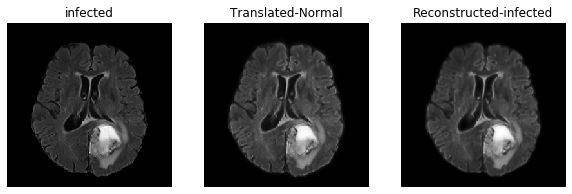

 Epoch: 1/100 | Batch: 2000/2701 | D-loss: 0.403, D-acc: 10.84% | G-loss: 0.990 | adv: 0.275 | recon: 0.019 | id: 0.027 | time: 0:22:16.000489

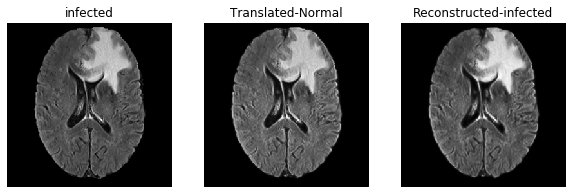

 Epoch: 2/100 | Batch: 1000/2701 | D-loss: 0.102, D-acc: 95.61% | G-loss: 1.883 | adv: 0.623 | recon: 0.028 | id: 0.048 | time: 0:41:14.438619

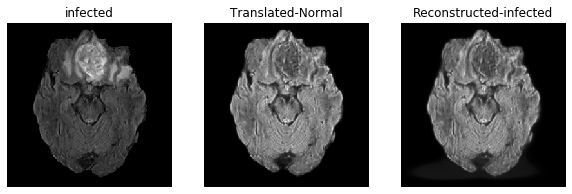

 Epoch: 2/100 | Batch: 2000/2701 | D-loss: 0.185, D-acc: 75.39% | G-loss: 1.481 | adv: 0.441 | recon: 0.027 | id: 0.042 | time: 0:52:23.2980089

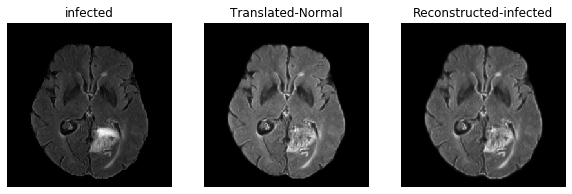

 Epoch: 3/100 | Batch: 1000/2701 | D-loss: 0.171, D-acc: 84.77% | G-loss: 1.249 | adv: 0.397 | recon: 0.019 | id: 0.046 | time: 1:11:19.4221591

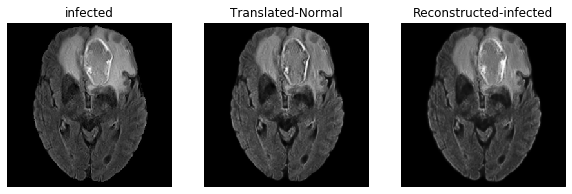

 Epoch: 3/100 | Batch: 2000/2701 | D-loss: 0.266, D-acc: 47.56% | G-loss: 1.129 | adv: 0.305 | recon: 0.022 | id: 0.061 | time: 1:22:27.8440293

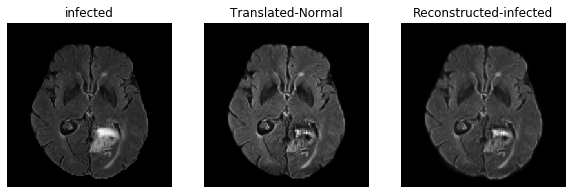

 Epoch: 4/100 | Batch: 1000/2701 | D-loss: 0.209, D-acc: 64.36% | G-loss: 1.188 | adv: 0.409 | recon: 0.016 | id: 0.028 | time: 1:41:26.610051

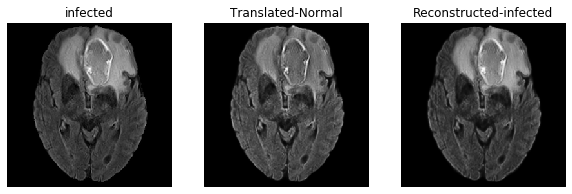

 Epoch: 4/100 | Batch: 2000/2701 | D-loss: 0.245, D-acc: 59.18% | G-loss: 1.185 | adv: 0.294 | recon: 0.027 | id: 0.024 | time: 1:52:35.361113

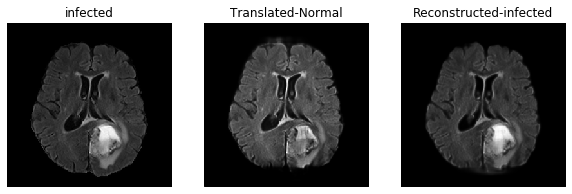

 Epoch: 5/100 | Batch: 1000/2701 | D-loss: 0.341, D-acc: 30.86% | G-loss: 1.036 | adv: 0.301 | recon: 0.019 | id: 0.024 | time: 2:11:28.110335

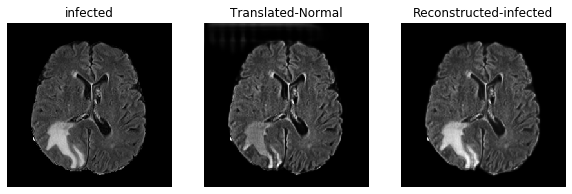

 Epoch: 5/100 | Batch: 2000/2701 | D-loss: 0.183, D-acc: 79.49% | G-loss: 1.167 | adv: 0.405 | recon: 0.016 | id: 0.022 | time: 2:22:35.876358

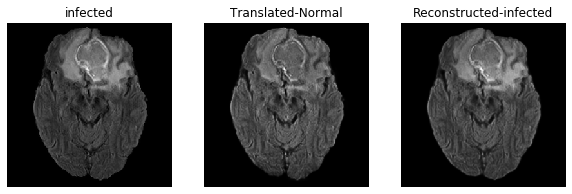

 Epoch: 6/100 | Batch: 1000/2701 | D-loss: 0.265, D-acc: 43.65% | G-loss: 1.001 | adv: 0.313 | recon: 0.016 | id: 0.025 | time: 2:41:28.203726

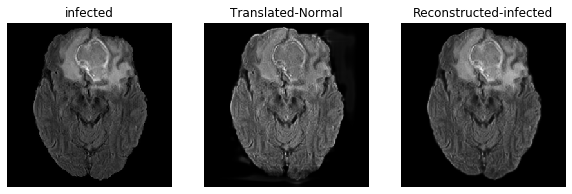

 Epoch: 6/100 | Batch: 2000/2701 | D-loss: 0.239, D-acc: 56.54% | G-loss: 1.215 | adv: 0.321 | recon: 0.026 | id: 0.032 | time: 2:52:27.514605

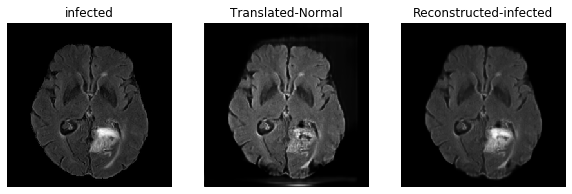

 Epoch: 7/100 | Batch: 1000/2701 | D-loss: 0.220, D-acc: 65.82% | G-loss: 1.049 | adv: 0.348 | recon: 0.016 | id: 0.015 | time: 3:11:09.218973

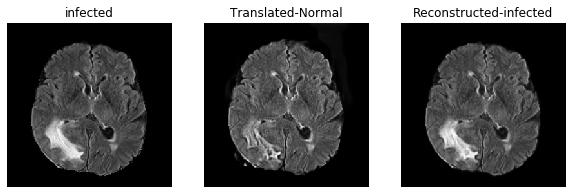

 Epoch: 7/100 | Batch: 2000/2701 | D-loss: 0.179, D-acc: 70.02% | G-loss: 1.376 | adv: 0.433 | recon: 0.023 | id: 0.016 | time: 3:22:09.032604

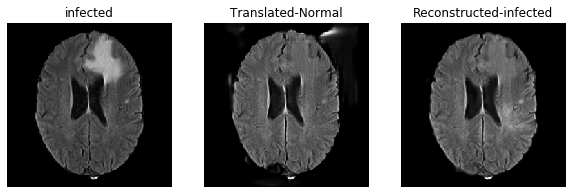

 Epoch: 8/100 | Batch: 1000/2701 | D-loss: 0.275, D-acc: 50.39% | G-loss: 1.032 | adv: 0.332 | recon: 0.017 | id: 0.016 | time: 3:40:51.501256

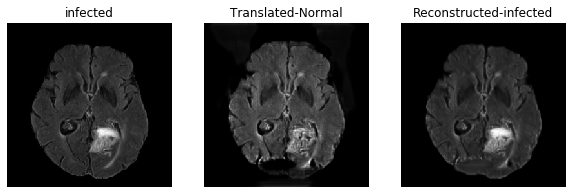

 Epoch: 8/100 | Batch: 2000/2701 | D-loss: 0.265, D-acc: 43.55% | G-loss: 1.134 | adv: 0.348 | recon: 0.019 | id: 0.043 | time: 3:51:52.562822

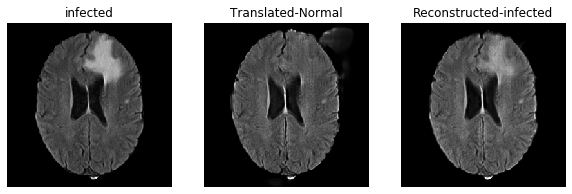

 Epoch: 9/100 | Batch: 1000/2701 | D-loss: 0.248, D-acc: 53.22% | G-loss: 1.082 | adv: 0.339 | recon: 0.018 | id: 0.015 | time: 4:10:23.296744

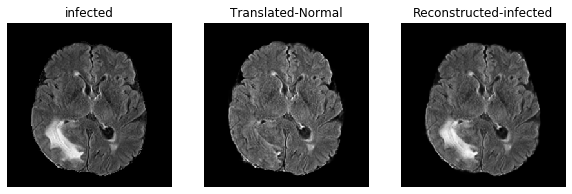

 Epoch: 9/100 | Batch: 2000/2701 | D-loss: 0.257, D-acc: 48.44% | G-loss: 1.097 | adv: 0.316 | recon: 0.022 | id: 0.012 | time: 4:21:21.015941

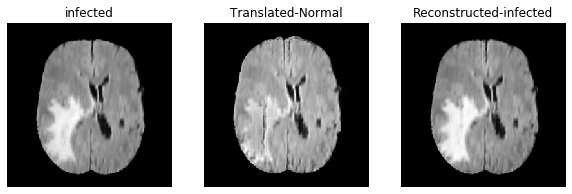

 Epoch: 10/100 | Batch: 1000/2701 | D-loss: 0.231, D-acc: 56.45% | G-loss: 1.159 | adv: 0.328 | recon: 0.023 | id: 0.020 | time: 4:40:01.766777

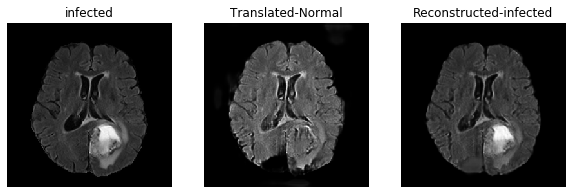

 Epoch: 10/100 | Batch: 2000/2701 | D-loss: 0.224, D-acc: 63.09% | G-loss: 1.426 | adv: 0.395 | recon: 0.030 | id: 0.028 | time: 4:51:03.703830

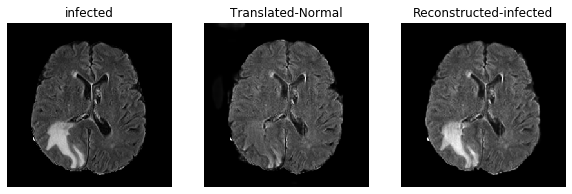

 Epoch: 11/100 | Batch: 1000/2701 | D-loss: 0.225, D-acc: 64.75% | G-loss: 1.489 | adv: 0.416 | recon: 0.032 | id: 0.014 | time: 5:09:53.359558

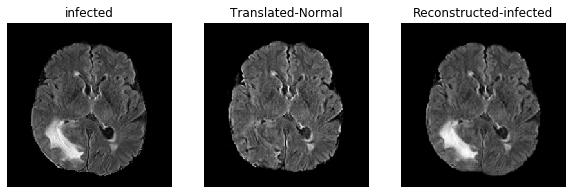

 Epoch: 11/100 | Batch: 2000/2701 | D-loss: 0.334, D-acc: 41.60% | G-loss: 1.258 | adv: 0.390 | recon: 0.020 | id: 0.028 | time: 5:20:57.298280

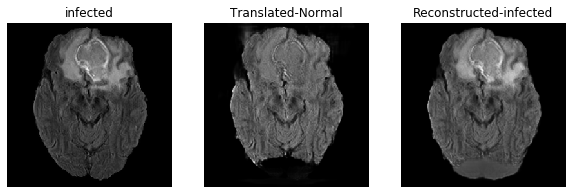

 Epoch: 12/100 | Batch: 1000/2701 | D-loss: 0.252, D-acc: 53.22% | G-loss: 1.464 | adv: 0.398 | recon: 0.030 | id: 0.028 | time: 5:39:50.297745

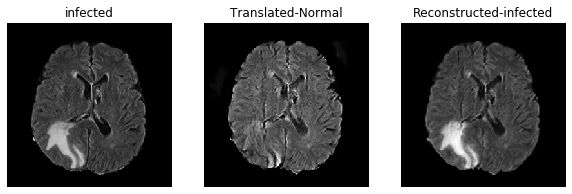

 Epoch: 12/100 | Batch: 2000/2701 | D-loss: 0.231, D-acc: 61.91% | G-loss: 1.717 | adv: 0.500 | recon: 0.033 | id: 0.034 | time: 5:50:48.937489

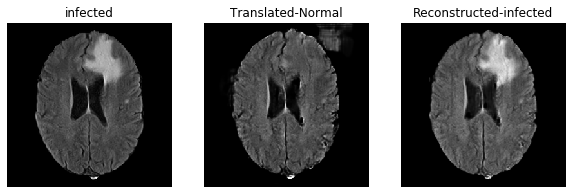

 Epoch: 13/100 | Batch: 1000/2701 | D-loss: 0.144, D-acc: 77.73% | G-loss: 2.335 | adv: 0.746 | recon: 0.038 | id: 0.071 | time: 6:09:24.938735

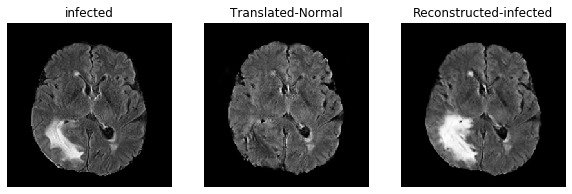

 Epoch: 13/100 | Batch: 2000/2701 | D-loss: 0.670, D-acc: 35.25% | G-loss: 1.525 | adv: 0.476 | recon: 0.024 | id: 0.044 | time: 6:20:20.187608

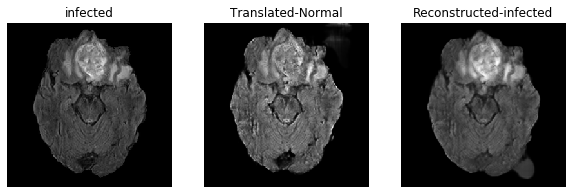

 Epoch: 14/100 | Batch: 1000/2701 | D-loss: 0.163, D-acc: 73.24% | G-loss: 2.082 | adv: 0.679 | recon: 0.034 | id: 0.023 | time: 6:38:56.501024

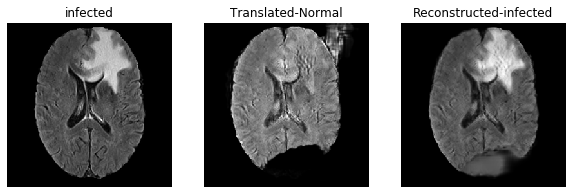

 Epoch: 14/100 | Batch: 2000/2701 | D-loss: 0.148, D-acc: 82.32% | G-loss: 1.884 | adv: 0.627 | recon: 0.030 | id: 0.019 | time: 6:49:52.484616

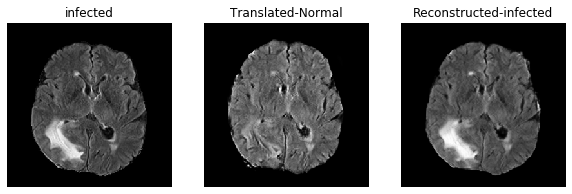

 Epoch: 15/100 | Batch: 1000/2701 | D-loss: 0.105, D-acc: 90.23% | G-loss: 2.478 | adv: 0.857 | recon: 0.036 | id: 0.026 | time: 7:08:30.969858

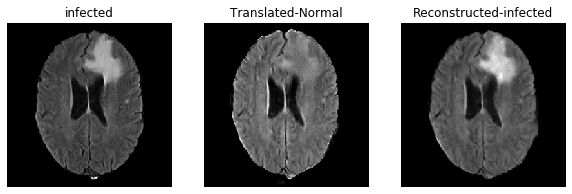

 Epoch: 15/100 | Batch: 2000/2701 | D-loss: 0.094, D-acc: 93.46% | G-loss: 2.335 | adv: 0.727 | recon: 0.040 | id: 0.057 | time: 7:19:37.937889

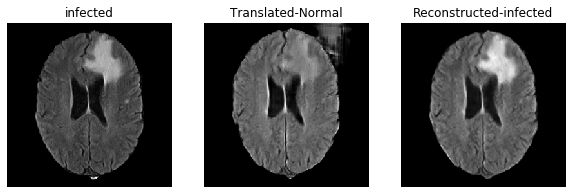

 Epoch: 16/100 | Batch: 1000/2701 | D-loss: 0.223, D-acc: 63.18% | G-loss: 2.347 | adv: 0.744 | recon: 0.040 | id: 0.035 | time: 7:38:32.547456

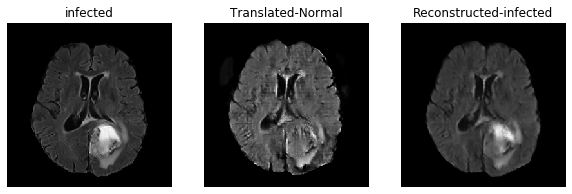

 Epoch: 16/100 | Batch: 2000/2701 | D-loss: 0.091, D-acc: 92.48% | G-loss: 2.712 | adv: 0.876 | recon: 0.045 | id: 0.030 | time: 7:49:39.220110

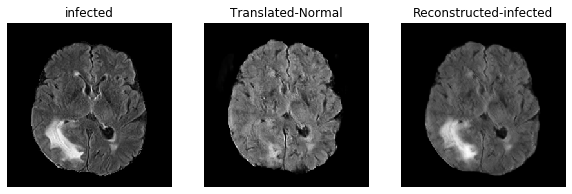

 Epoch: 17/100 | Batch: 1000/2701 | D-loss: 0.106, D-acc: 85.64% | G-loss: 2.374 | adv: 0.794 | recon: 0.036 | id: 0.038 | time: 8:08:33.719759

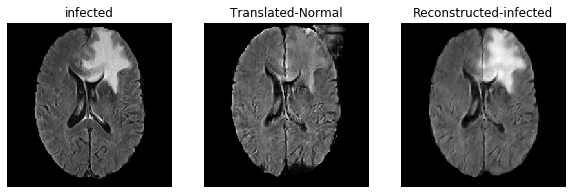

 Epoch: 17/100 | Batch: 2000/2701 | D-loss: 0.114, D-acc: 84.96% | G-loss: 2.702 | adv: 0.891 | recon: 0.042 | id: 0.024 | time: 8:19:29.8908213

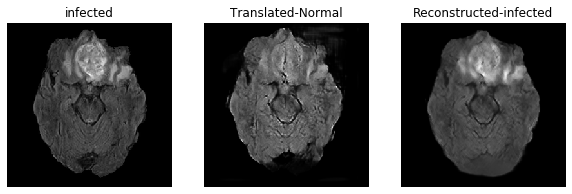

 Epoch: 18/100 | Batch: 1000/2701 | D-loss: 0.073, D-acc: 96.19% | G-loss: 2.726 | adv: 0.964 | recon: 0.037 | id: 0.034 | time: 8:38:06.344094

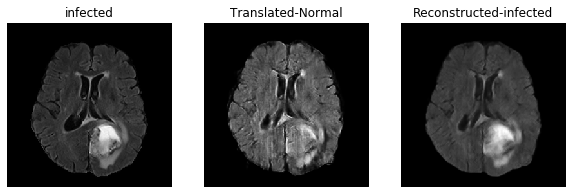

 Epoch: 18/100 | Batch: 2000/2701 | D-loss: 0.134, D-acc: 81.93% | G-loss: 2.368 | adv: 0.810 | recon: 0.034 | id: 0.026 | time: 8:49:01.9229644

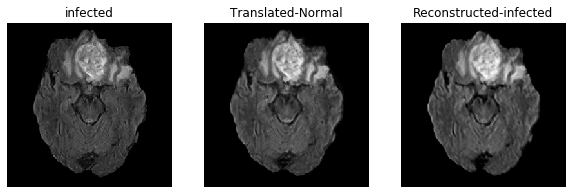

 Epoch: 19/100 | Batch: 1000/2701 | D-loss: 0.106, D-acc: 92.19% | G-loss: 2.294 | adv: 0.777 | recon: 0.034 | id: 0.028 | time: 9:07:38.6101527

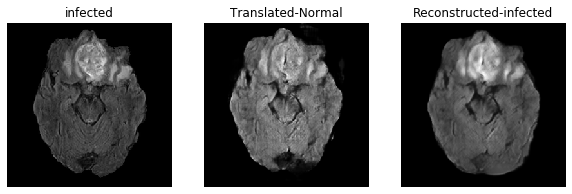

 Epoch: 19/100 | Batch: 2000/2701 | D-loss: 0.142, D-acc: 76.56% | G-loss: 2.482 | adv: 0.848 | recon: 0.035 | id: 0.057 | time: 9:18:38.563981

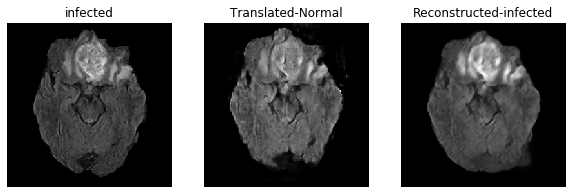

 Epoch: 20/100 | Batch: 1000/2701 | D-loss: 0.089, D-acc: 88.96% | G-loss: 2.671 | adv: 0.973 | recon: 0.034 | id: 0.021 | time: 9:37:34.4075297

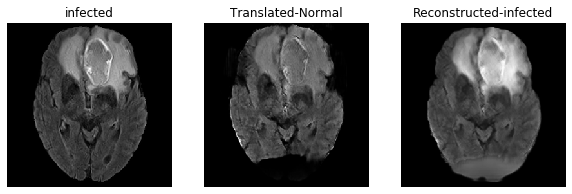

 Epoch: 20/100 | Batch: 2000/2701 | D-loss: 0.071, D-acc: 98.24% | G-loss: 2.741 | adv: 0.946 | recon: 0.039 | id: 0.034 | time: 9:48:41.2975874

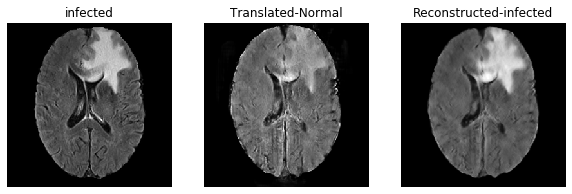

 Epoch: 21/100 | Batch: 1000/2701 | D-loss: 0.132, D-acc: 82.03% | G-loss: 2.443 | adv: 0.841 | recon: 0.035 | id: 0.026 | time: 10:07:36.016915

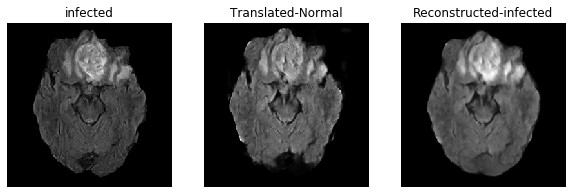

 Epoch: 21/100 | Batch: 2000/2701 | D-loss: 0.078, D-acc: 94.43% | G-loss: 2.756 | adv: 0.970 | recon: 0.038 | id: 0.030 | time: 10:18:39.0785255

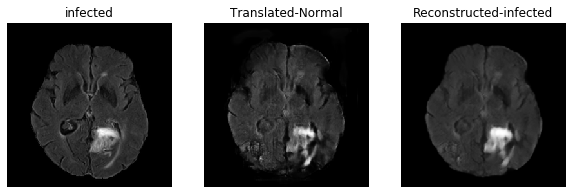

 Epoch: 22/100 | Batch: 1000/2701 | D-loss: 0.034, D-acc: 99.80% | G-loss: 3.072 | adv: 1.022 | recon: 0.049 | id: 0.033 | time: 10:37:14.2038641

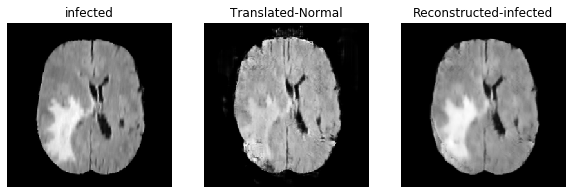

 Epoch: 22/100 | Batch: 2000/2701 | D-loss: 0.044, D-acc: 98.05% | G-loss: 3.030 | adv: 1.001 | recon: 0.047 | id: 0.059 | time: 10:48:09.2965011

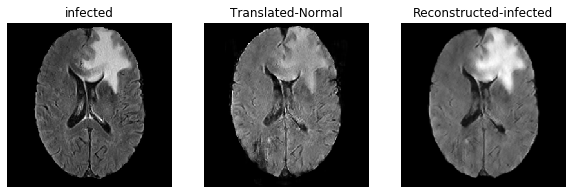

 Epoch: 23/100 | Batch: 1000/2701 | D-loss: 0.232, D-acc: 50.20% | G-loss: 2.123 | adv: 0.679 | recon: 0.035 | id: 0.032 | time: 11:06:45.0162476

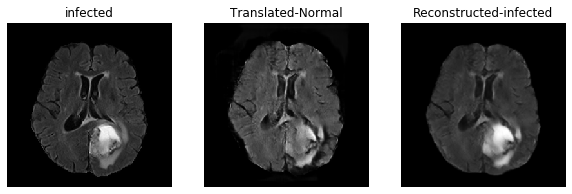

 Epoch: 23/100 | Batch: 2000/2701 | D-loss: 0.194, D-acc: 57.42% | G-loss: 1.665 | adv: 0.589 | recon: 0.022 | id: 0.035 | time: 11:17:43.188906

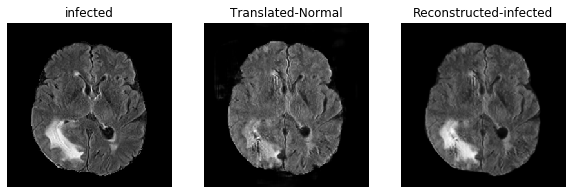

 Epoch: 24/100 | Batch: 1000/2701 | D-loss: 0.147, D-acc: 77.44% | G-loss: 2.176 | adv: 0.643 | recon: 0.040 | id: 0.022 | time: 11:36:34.515903

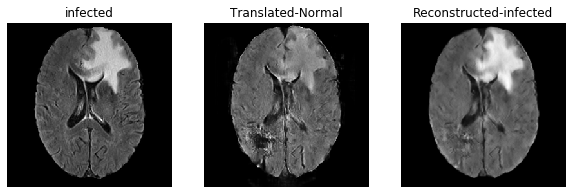

 Epoch: 24/100 | Batch: 2000/2701 | D-loss: 0.174, D-acc: 75.29% | G-loss: 2.538 | adv: 0.833 | recon: 0.038 | id: 0.023 | time: 11:47:40.4525937

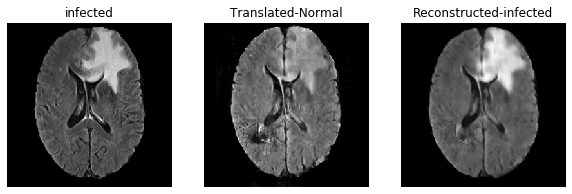

 Epoch: 25/100 | Batch: 1000/2701 | D-loss: 0.148, D-acc: 81.15% | G-loss: 2.855 | adv: 0.901 | recon: 0.048 | id: 0.062 | time: 12:06:34.7813426

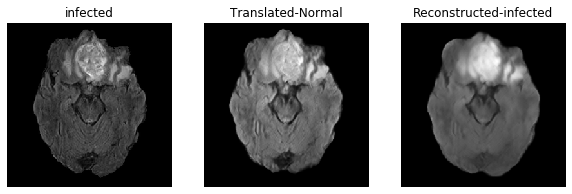

 Epoch: 25/100 | Batch: 2000/2701 | D-loss: 0.083, D-acc: 93.36% | G-loss: 2.806 | adv: 0.814 | recon: 0.053 | id: 0.085 | time: 12:17:37.5159400

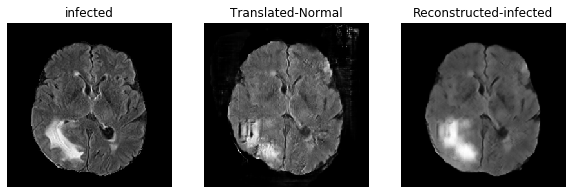

 Epoch: 26/100 | Batch: 1000/2701 | D-loss: 0.074, D-acc: 91.02% | G-loss: 3.077 | adv: 0.946 | recon: 0.057 | id: 0.027 | time: 12:36:14.3449223

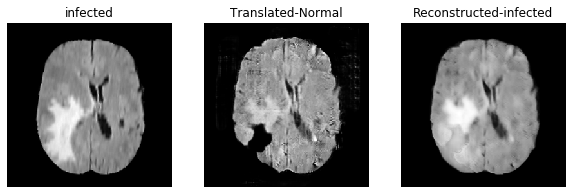

 Epoch: 26/100 | Batch: 2000/2701 | D-loss: 0.116, D-acc: 89.36% | G-loss: 3.183 | adv: 1.038 | recon: 0.053 | id: 0.024 | time: 12:47:10.6260613

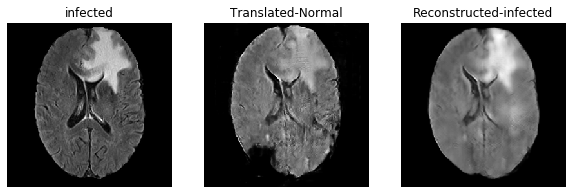

 Epoch: 27/100 | Batch: 1000/2701 | D-loss: 0.023, D-acc: 100.00% | G-loss: 2.757 | adv: 1.011 | recon: 0.033 | id: 0.046 | time: 13:05:45.234983

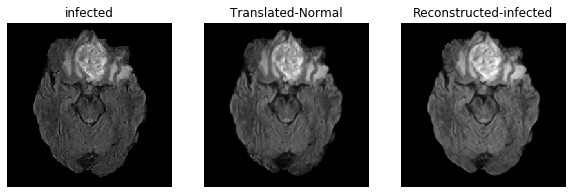

 Epoch: 27/100 | Batch: 2000/2701 | D-loss: 0.017, D-acc: 100.00% | G-loss: 2.470 | adv: 0.951 | recon: 0.025 | id: 0.037 | time: 13:16:43.687946

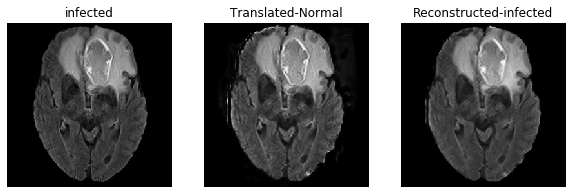

 Epoch: 28/100 | Batch: 1000/2701 | D-loss: 0.104, D-acc: 91.80% | G-loss: 3.096 | adv: 0.911 | recon: 0.056 | id: 0.068 | time: 13:35:38.0171690

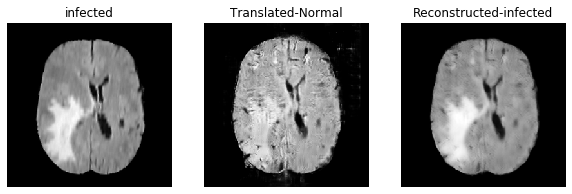

 Epoch: 28/100 | Batch: 2000/2701 | D-loss: 0.066, D-acc: 93.26% | G-loss: 3.262 | adv: 0.968 | recon: 0.062 | id: 0.047 | time: 13:46:44.3287130

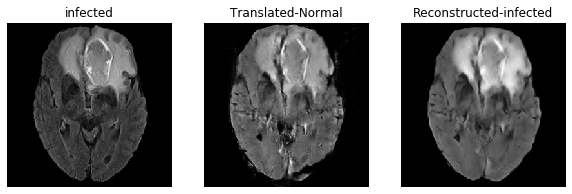

 Epoch: 29/100 | Batch: 1000/2701 | D-loss: 0.155, D-acc: 77.44% | G-loss: 2.669 | adv: 0.834 | recon: 0.044 | id: 0.033 | time: 14:05:37.3591380

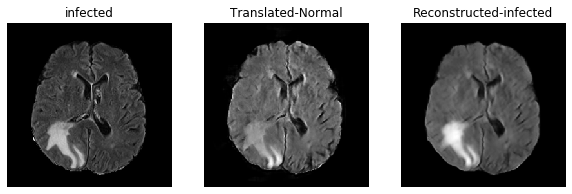

 Epoch: 29/100 | Batch: 2000/2701 | D-loss: 0.114, D-acc: 83.50% | G-loss: 2.965 | adv: 0.983 | recon: 0.048 | id: 0.027 | time: 14:16:40.9536893

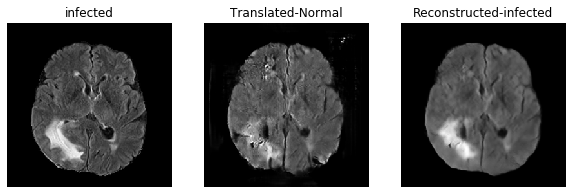

 Epoch: 30/100 | Batch: 1000/2701 | D-loss: 0.076, D-acc: 88.96% | G-loss: 3.266 | adv: 0.964 | recon: 0.060 | id: 0.106 | time: 14:35:16.2345333

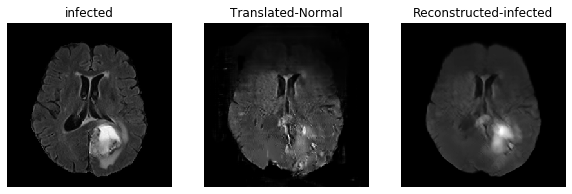

 Epoch: 30/100 | Batch: 2000/2701 | D-loss: 0.181, D-acc: 68.26% | G-loss: 3.430 | adv: 1.121 | recon: 0.057 | id: 0.029 | time: 14:46:11.2356601

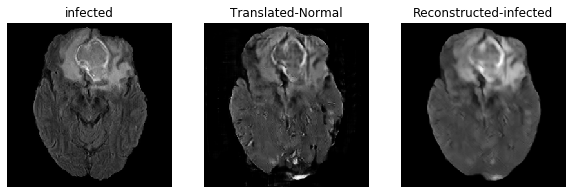

 Epoch: 31/100 | Batch: 1000/2701 | D-loss: 0.075, D-acc: 97.46% | G-loss: 2.570 | adv: 0.861 | recon: 0.039 | id: 0.037 | time: 15:04:47.0790584

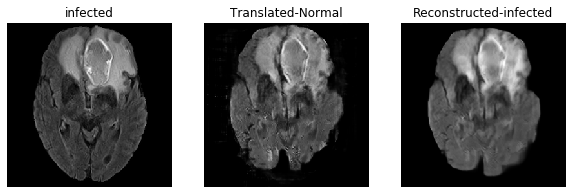

 Epoch: 31/100 | Batch: 2000/2701 | D-loss: 0.055, D-acc: 99.71% | G-loss: 2.868 | adv: 0.922 | recon: 0.047 | id: 0.038 | time: 15:15:49.8135127

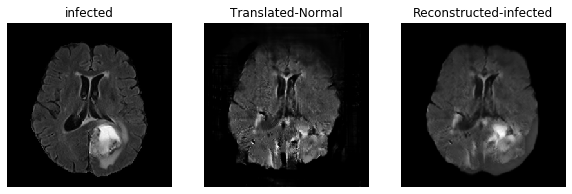

 Epoch: 32/100 | Batch: 1000/2701 | D-loss: 0.070, D-acc: 98.63% | G-loss: 2.934 | adv: 0.968 | recon: 0.046 | id: 0.026 | time: 15:34:41.5632074

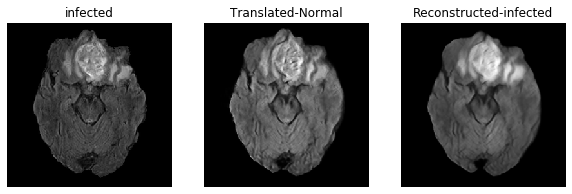

 Epoch: 32/100 | Batch: 2000/2701 | D-loss: 0.032, D-acc: 100.00% | G-loss: 2.970 | adv: 0.980 | recon: 0.047 | id: 0.025 | time: 15:45:47.125172

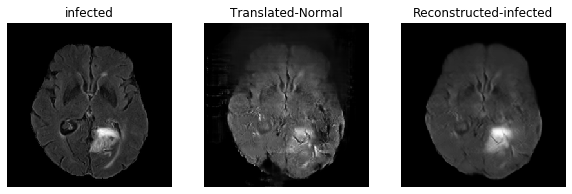

 Epoch: 33/100 | Batch: 1000/2701 | D-loss: 0.019, D-acc: 100.00% | G-loss: 2.509 | adv: 0.945 | recon: 0.029 | id: 0.018 | time: 16:04:39.922535

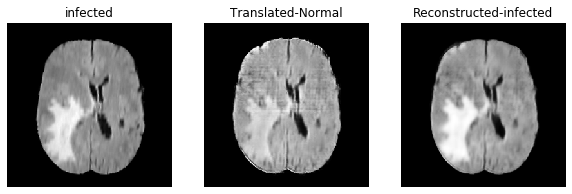

 Epoch: 33/100 | Batch: 2000/2701 | D-loss: 0.070, D-acc: 97.95% | G-loss: 2.871 | adv: 0.953 | recon: 0.044 | id: 0.057 | time: 16:15:38.0000529

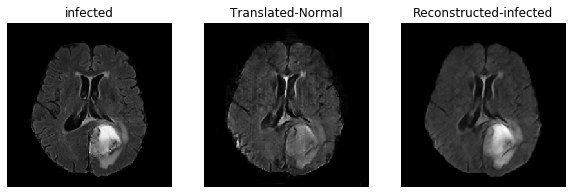

 Epoch: 34/100 | Batch: 1000/2701 | D-loss: 0.024, D-acc: 100.00% | G-loss: 3.050 | adv: 0.948 | recon: 0.054 | id: 0.021 | time: 16:34:13.297576

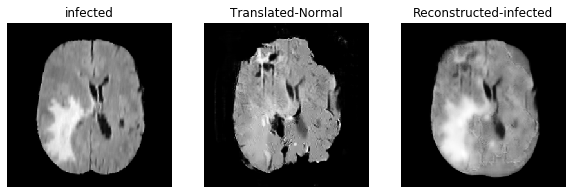

 Epoch: 34/100 | Batch: 2000/2701 | D-loss: 0.044, D-acc: 97.95% | G-loss: 3.400 | adv: 1.260 | recon: 0.039 | id: 0.053 | time: 16:45:07.9214061

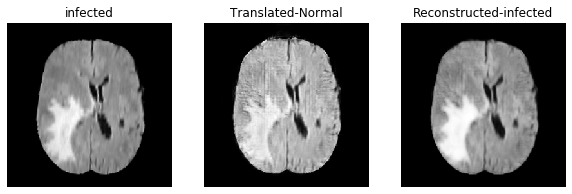

 Epoch: 35/100 | Batch: 1000/2701 | D-loss: 0.065, D-acc: 98.83% | G-loss: 2.815 | adv: 0.958 | recon: 0.043 | id: 0.024 | time: 17:03:43.1410686

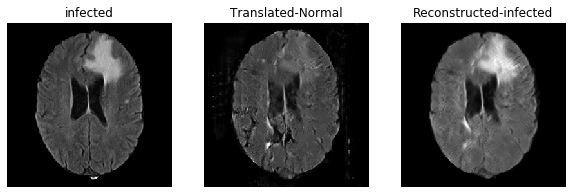

 Epoch: 35/100 | Batch: 2000/2701 | D-loss: 0.087, D-acc: 93.55% | G-loss: 2.720 | adv: 0.889 | recon: 0.043 | id: 0.042 | time: 17:14:38.9541143

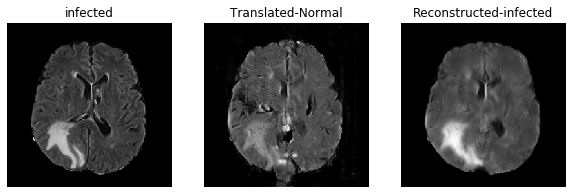

 Epoch: 36/100 | Batch: 1000/2701 | D-loss: 0.071, D-acc: 97.17% | G-loss: 2.719 | adv: 0.916 | recon: 0.040 | id: 0.019 | time: 17:33:30.2663712

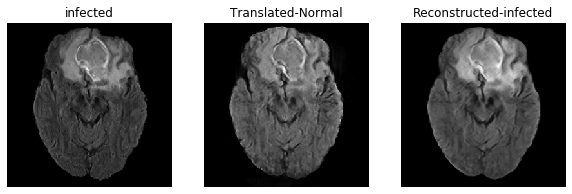

 Epoch: 36/100 | Batch: 2000/2701 | D-loss: 0.033, D-acc: 100.00% | G-loss: 3.418 | adv: 1.104 | recon: 0.057 | id: 0.031 | time: 17:44:35.126668

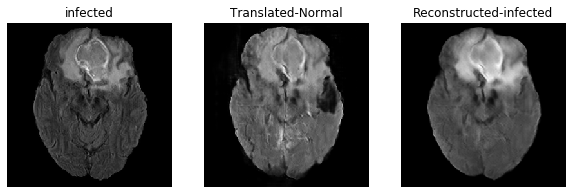

 Epoch: 37/100 | Batch: 1000/2701 | D-loss: 0.035, D-acc: 99.90% | G-loss: 3.180 | adv: 0.976 | recon: 0.056 | id: 0.062 | time: 18:03:26.5617059

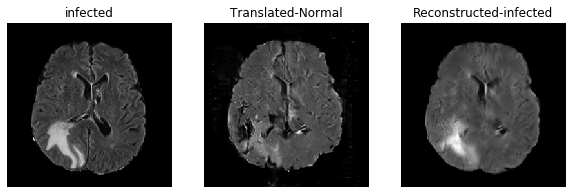

 Epoch: 37/100 | Batch: 2000/2701 | D-loss: 0.098, D-acc: 96.48% | G-loss: 3.478 | adv: 1.252 | recon: 0.041 | id: 0.068 | time: 18:14:30.2667661

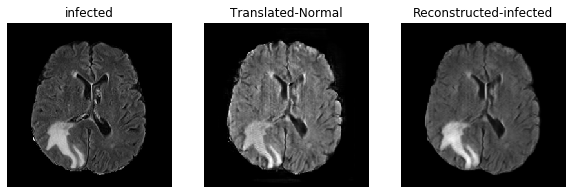

 Epoch: 38/100 | Batch: 1000/2701 | D-loss: 0.065, D-acc: 99.71% | G-loss: 3.282 | adv: 1.024 | recon: 0.058 | id: 0.020 | time: 18:33:06.2036763

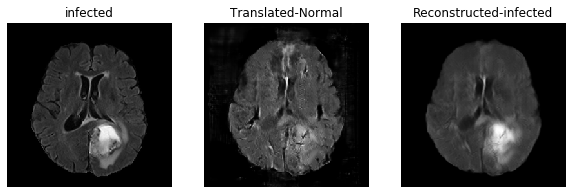

 Epoch: 38/100 | Batch: 2000/2701 | D-loss: 0.026, D-acc: 100.00% | G-loss: 3.180 | adv: 1.005 | recon: 0.052 | id: 0.033 | time: 18:44:02.218880

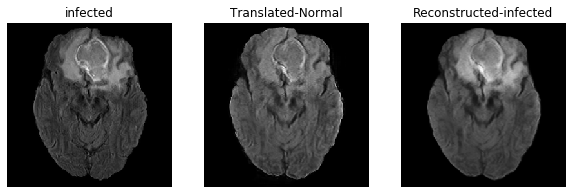

 Epoch: 39/100 | Batch: 1000/2701 | D-loss: 0.062, D-acc: 99.61% | G-loss: 2.865 | adv: 0.948 | recon: 0.046 | id: 0.018 | time: 19:02:36.8604495

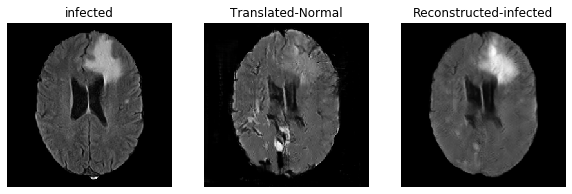

 Epoch: 39/100 | Batch: 2000/2701 | D-loss: 0.047, D-acc: 99.61% | G-loss: 2.829 | adv: 1.062 | recon: 0.031 | id: 0.061 | time: 19:13:37.6411566

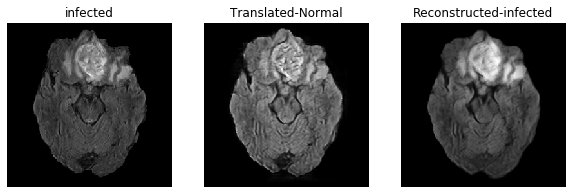

 Epoch: 40/100 | Batch: 1000/2701 | D-loss: 0.017, D-acc: 100.00% | G-loss: 2.635 | adv: 0.949 | recon: 0.033 | id: 0.039 | time: 19:32:30.423756

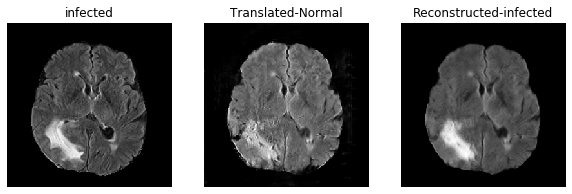

 Epoch: 40/100 | Batch: 2000/2701 | D-loss: 0.068, D-acc: 97.46% | G-loss: 3.168 | adv: 1.013 | recon: 0.054 | id: 0.039 | time: 19:43:35.1571671

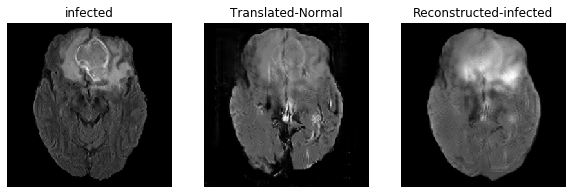

 Epoch: 41/100 | Batch: 1000/2701 | D-loss: 0.017, D-acc: 100.00% | G-loss: 2.610 | adv: 0.943 | recon: 0.035 | id: 0.014 | time: 20:02:27.750586

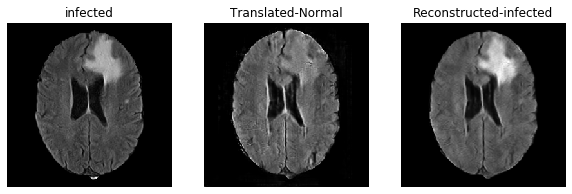

 Epoch: 41/100 | Batch: 2000/2701 | D-loss: 0.076, D-acc: 86.91% | G-loss: 2.891 | adv: 0.945 | recon: 0.048 | id: 0.013 | time: 20:13:28.1729082

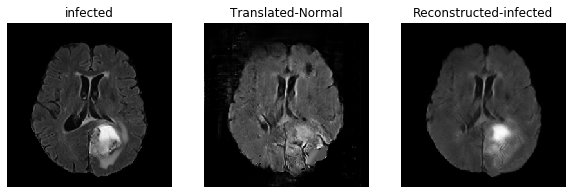

 Epoch: 42/100 | Batch: 1000/2701 | D-loss: 0.048, D-acc: 97.75% | G-loss: 3.031 | adv: 1.101 | recon: 0.038 | id: 0.020 | time: 20:32:03.5315787

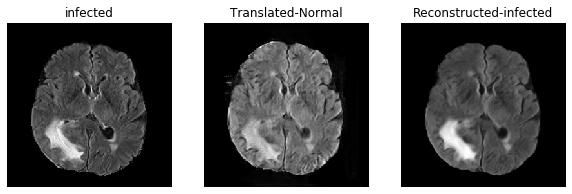

 Epoch: 42/100 | Batch: 2000/2701 | D-loss: 0.010, D-acc: 100.00% | G-loss: 2.909 | adv: 1.056 | recon: 0.037 | id: 0.042 | time: 20:43:00.425033

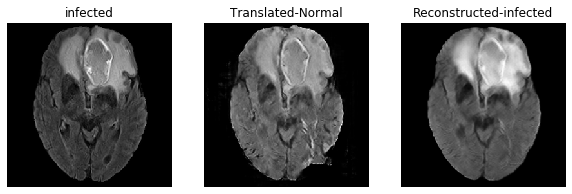

 Epoch: 43/100 | Batch: 1000/2701 | D-loss: 0.045, D-acc: 99.80% | G-loss: 2.634 | adv: 0.927 | recon: 0.037 | id: 0.023 | time: 21:01:36.5010709

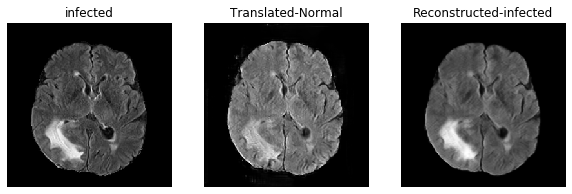

 Epoch: 43/100 | Batch: 2000/2701 | D-loss: 0.026, D-acc: 100.00% | G-loss: 3.272 | adv: 1.116 | recon: 0.049 | id: 0.047 | time: 21:12:38.063445

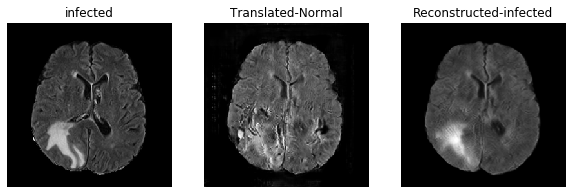

 Epoch: 44/100 | Batch: 1000/2701 | D-loss: 0.077, D-acc: 88.18% | G-loss: 2.810 | adv: 0.919 | recon: 0.046 | id: 0.020 | time: 21:31:29.8908306

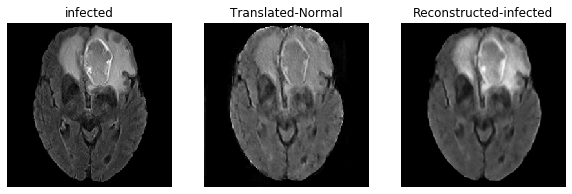

 Epoch: 44/100 | Batch: 2000/2701 | D-loss: 0.089, D-acc: 95.02% | G-loss: 3.061 | adv: 1.071 | recon: 0.042 | id: 0.013 | time: 21:42:34.6254089

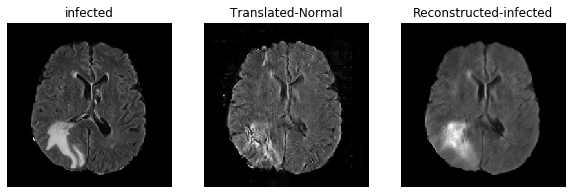

 Epoch: 45/100 | Batch: 1000/2701 | D-loss: 0.010, D-acc: 100.00% | G-loss: 2.691 | adv: 1.029 | recon: 0.030 | id: 0.014 | time: 22:01:26.876339

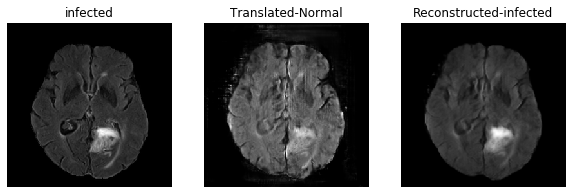

 Epoch: 45/100 | Batch: 2000/2701 | D-loss: 0.034, D-acc: 100.00% | G-loss: 3.242 | adv: 1.218 | recon: 0.036 | id: 0.033 | time: 22:12:26.516811

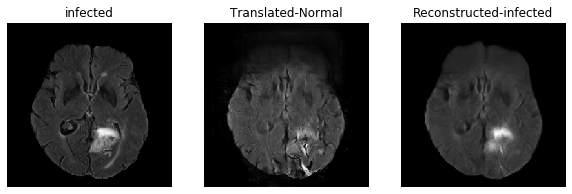

 Epoch: 46/100 | Batch: 1000/2701 | D-loss: 0.007, D-acc: 100.00% | G-loss: 3.670 | adv: 0.999 | recon: 0.078 | id: 0.083 | time: 22:31:00.454397

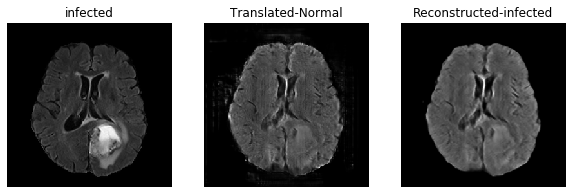

 Epoch: 46/100 | Batch: 2000/2701 | D-loss: 0.019, D-acc: 100.00% | G-loss: 2.819 | adv: 1.041 | recon: 0.035 | id: 0.019 | time: 22:41:54.735350

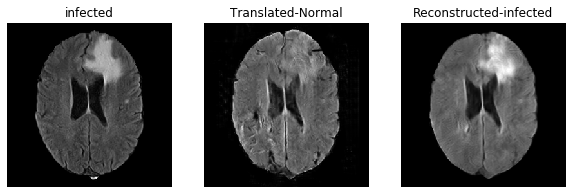

 Epoch: 47/100 | Batch: 1000/2701 | D-loss: 0.043, D-acc: 99.80% | G-loss: 3.238 | adv: 1.108 | recon: 0.049 | id: 0.017 | time: 23:00:29.1731307

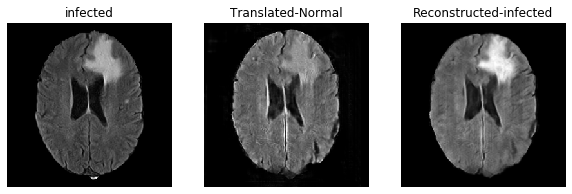

 Epoch: 47/100 | Batch: 2000/2701 | D-loss: 0.073, D-acc: 93.36% | G-loss: 3.012 | adv: 0.976 | recon: 0.050 | id: 0.025 | time: 23:11:27.7821317

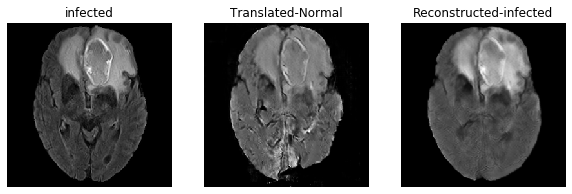

 Epoch: 48/100 | Batch: 1000/2701 | D-loss: 0.037, D-acc: 99.90% | G-loss: 3.110 | adv: 1.043 | recon: 0.049 | id: 0.022 | time: 23:30:19.9229812

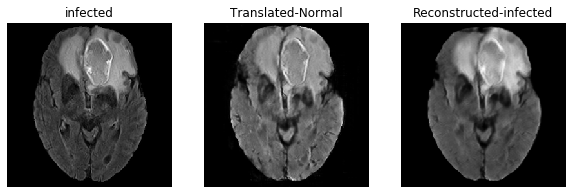

 Epoch: 48/100 | Batch: 2000/2701 | D-loss: 0.051, D-acc: 99.61% | G-loss: 2.860 | adv: 1.014 | recon: 0.040 | id: 0.014 | time: 23:41:23.0476627

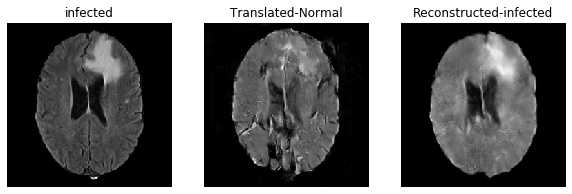

 Epoch: 49/100 | Batch: 1000/2701 | D-loss: 0.016, D-acc: 100.00% | G-loss: 2.896 | adv: 1.027 | recon: 0.040 | id: 0.015 | time: 1 day, 0:00:11.813235

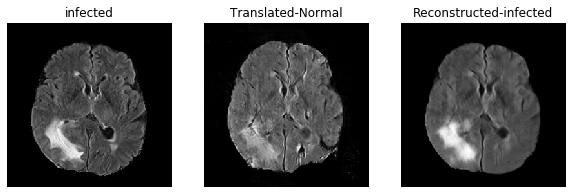

 Epoch: 49/100 | Batch: 2000/2701 | D-loss: 0.032, D-acc: 99.90% | G-loss: 2.936 | adv: 0.951 | recon: 0.049 | id: 0.019 | time: 1 day, 0:11:12.4372715

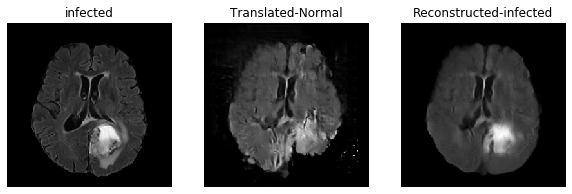

 Epoch: 50/100 | Batch: 1000/2701 | D-loss: 0.045, D-acc: 99.90% | G-loss: 3.087 | adv: 1.118 | recon: 0.039 | id: 0.054 | time: 1 day, 0:29:46.5159772

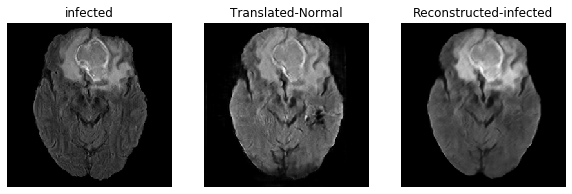

 Epoch: 50/100 | Batch: 2000/2701 | D-loss: 0.013, D-acc: 100.00% | G-loss: 3.340 | adv: 1.052 | recon: 0.059 | id: 0.020 | time: 1 day, 0:40:40.953703

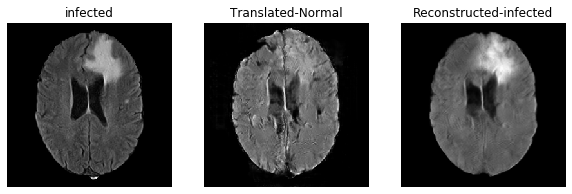

 Epoch: 51/100 | Batch: 1000/2701 | D-loss: 0.022, D-acc: 99.90% | G-loss: 2.678 | adv: 0.946 | recon: 0.037 | id: 0.018 | time: 1 day, 0:59:14.0951874

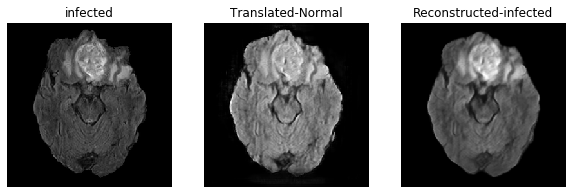

 Epoch: 51/100 | Batch: 2000/2701 | D-loss: 0.048, D-acc: 99.71% | G-loss: 2.647 | adv: 1.028 | recon: 0.028 | id: 0.010 | time: 1 day, 1:10:10.7963902

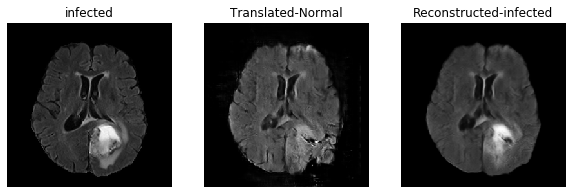

 Epoch: 52/100 | Batch: 1000/2701 | D-loss: 0.052, D-acc: 99.02% | G-loss: 4.525 | adv: 1.103 | recon: 0.111 | id: 0.071 | time: 1 day, 1:29:01.7975603

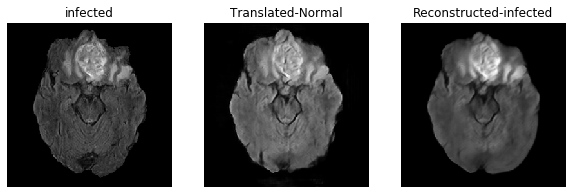

 Epoch: 52/100 | Batch: 2000/2701 | D-loss: 0.033, D-acc: 98.24% | G-loss: 2.958 | adv: 0.966 | recon: 0.047 | id: 0.042 | time: 1 day, 1:40:06.8913408

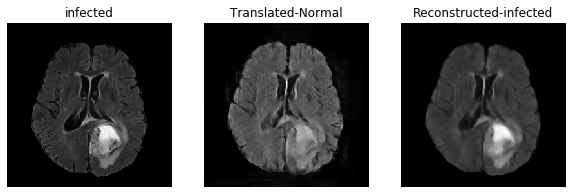

 Epoch: 53/100 | Batch: 1000/2701 | D-loss: 0.019, D-acc: 100.00% | G-loss: 2.561 | adv: 0.933 | recon: 0.033 | id: 0.012 | time: 1 day, 1:58:56.499977

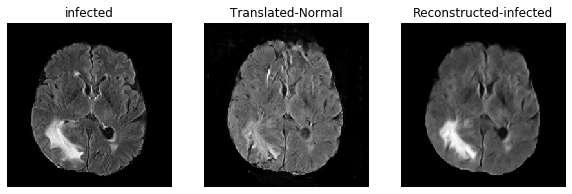

 Epoch: 53/100 | Batch: 2000/2701 | D-loss: 0.083, D-acc: 90.82% | G-loss: 2.966 | adv: 0.959 | recon: 0.050 | id: 0.013 | time: 1 day, 2:09:58.0947384

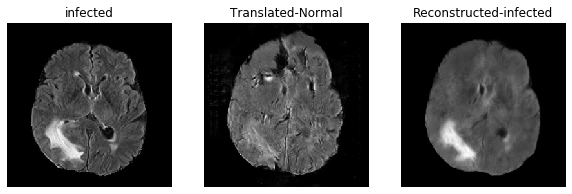

 Epoch: 54/100 | Batch: 1000/2701 | D-loss: 0.025, D-acc: 99.32% | G-loss: 3.241 | adv: 0.959 | recon: 0.064 | id: 0.013 | time: 1 day, 2:28:32.6255317

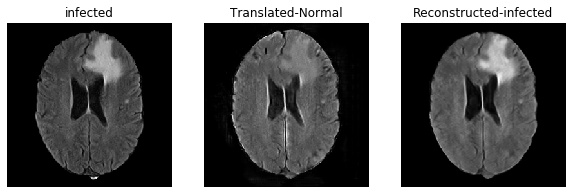

 Epoch: 54/100 | Batch: 2000/2701 | D-loss: 0.041, D-acc: 100.00% | G-loss: 2.576 | adv: 0.831 | recon: 0.042 | id: 0.041 | time: 1 day, 2:39:26.672321

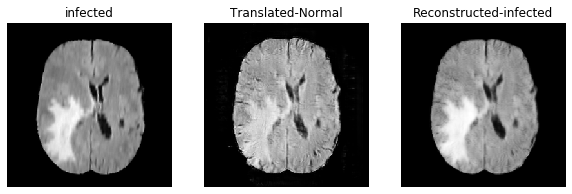

 Epoch: 55/100 | Batch: 1000/2701 | D-loss: 0.048, D-acc: 99.61% | G-loss: 2.573 | adv: 0.899 | recon: 0.037 | id: 0.016 | time: 1 day, 2:58:00.7817144

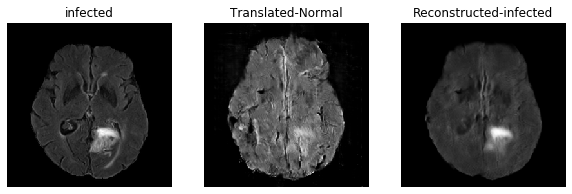

 Epoch: 55/100 | Batch: 2000/2701 | D-loss: 0.018, D-acc: 100.00% | G-loss: 2.981 | adv: 1.049 | recon: 0.041 | id: 0.043 | time: 1 day, 3:08:55.297579

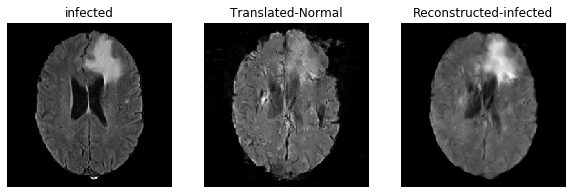

 Epoch: 56/100 | Batch: 1000/2701 | D-loss: 0.021, D-acc: 99.71% | G-loss: 2.815 | adv: 1.077 | recon: 0.031 | id: 0.018 | time: 1 day, 3:27:44.7503767

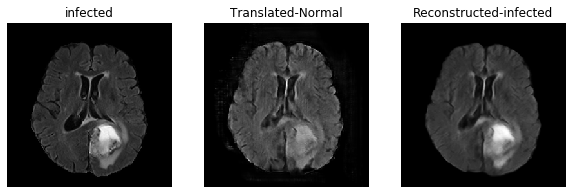

 Epoch: 56/100 | Batch: 2000/2701 | D-loss: 0.036, D-acc: 100.00% | G-loss: 2.980 | adv: 1.027 | recon: 0.045 | id: 0.018 | time: 1 day, 3:38:49.500609

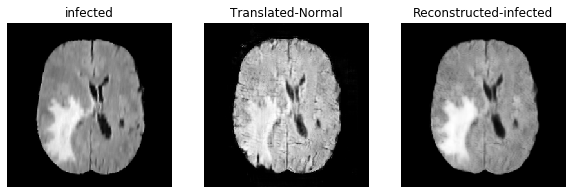

 Epoch: 57/100 | Batch: 1000/2701 | D-loss: 0.031, D-acc: 99.61% | G-loss: 2.932 | adv: 1.048 | recon: 0.039 | id: 0.014 | time: 1 day, 3:57:39.7346076

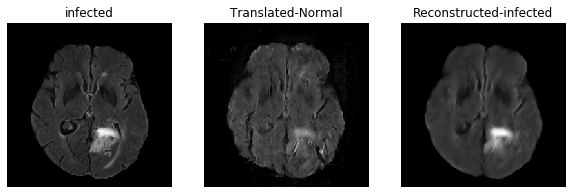

 Epoch: 57/100 | Batch: 2000/2701 | D-loss: 0.009, D-acc: 100.00% | G-loss: 2.710 | adv: 1.055 | recon: 0.027 | id: 0.030 | time: 1 day, 4:08:44.813470

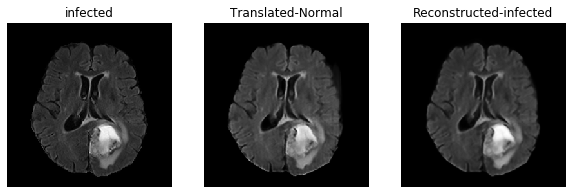

 Epoch: 58/100 | Batch: 1000/2701 | D-loss: 0.011, D-acc: 100.00% | G-loss: 2.900 | adv: 1.052 | recon: 0.038 | id: 0.016 | time: 1 day, 4:27:19.563677

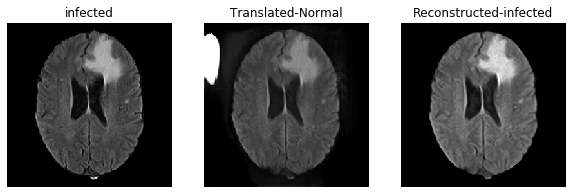

 Epoch: 58/100 | Batch: 2000/2701 | D-loss: 0.025, D-acc: 100.00% | G-loss: 2.798 | adv: 1.083 | recon: 0.030 | id: 0.015 | time: 1 day, 4:38:14.000422

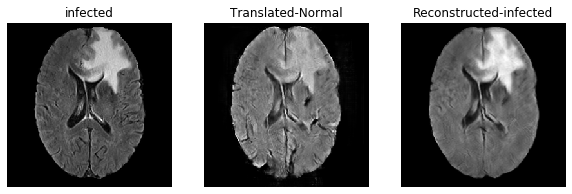

 Epoch: 59/100 | Batch: 1000/2701 | D-loss: 0.020, D-acc: 100.00% | G-loss: 3.195 | adv: 1.102 | recon: 0.046 | id: 0.058 | time: 1 day, 4:56:48.392092

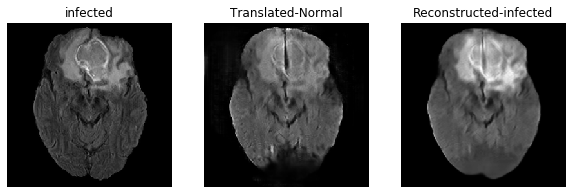

 Epoch: 59/100 | Batch: 2000/2701 | D-loss: 0.011, D-acc: 100.00% | G-loss: 2.643 | adv: 1.022 | recon: 0.029 | id: 0.012 | time: 1 day, 5:07:44.094110

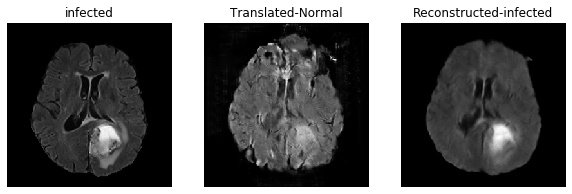

 Epoch: 60/100 | Batch: 1000/2701 | D-loss: 0.010, D-acc: 100.00% | G-loss: 2.511 | adv: 0.966 | recon: 0.027 | id: 0.013 | time: 1 day, 5:26:34.047432

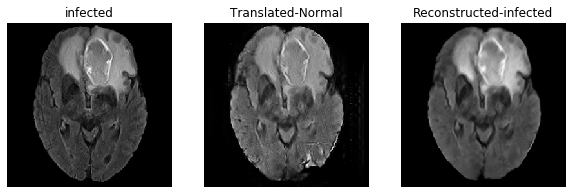

 Epoch: 60/100 | Batch: 2000/2701 | D-loss: 0.010, D-acc: 100.00% | G-loss: 2.651 | adv: 1.031 | recon: 0.028 | id: 0.017 | time: 1 day, 5:37:37.001387

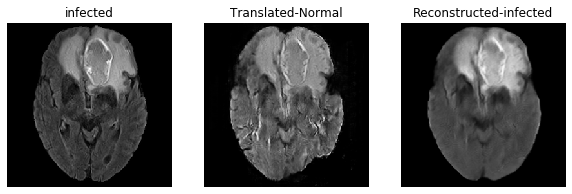

 Epoch: 61/100 | Batch: 1000/2701 | D-loss: 0.022, D-acc: 100.00% | G-loss: 2.917 | adv: 1.001 | recon: 0.044 | id: 0.017 | time: 1 day, 5:56:29.046707

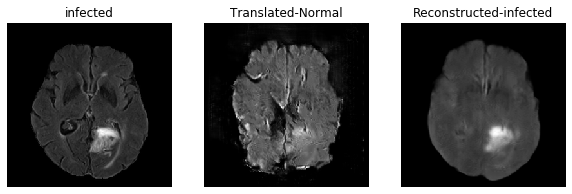

 Epoch: 61/100 | Batch: 2000/2701 | D-loss: 0.016, D-acc: 100.00% | G-loss: 2.613 | adv: 0.952 | recon: 0.033 | id: 0.019 | time: 1 day, 6:07:32.345088

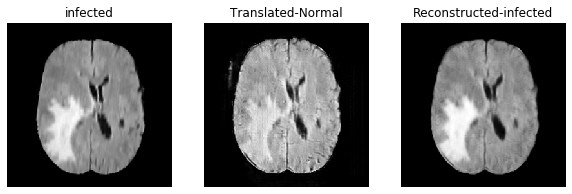

 Epoch: 62/100 | Batch: 1000/2701 | D-loss: 0.040, D-acc: 100.00% | G-loss: 2.901 | adv: 1.007 | recon: 0.040 | id: 0.063 | time: 1 day, 6:26:06.086515

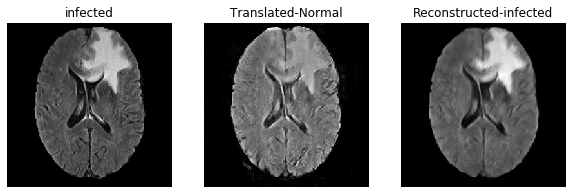

 Epoch: 62/100 | Batch: 2000/2701 | D-loss: 0.015, D-acc: 100.00% | G-loss: 2.552 | adv: 0.954 | recon: 0.031 | id: 0.016 | time: 1 day, 6:37:00.111585

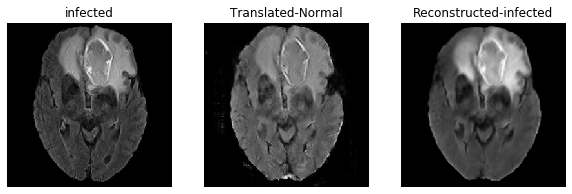

 Epoch: 63/100 | Batch: 1000/2701 | D-loss: 0.024, D-acc: 100.00% | G-loss: 2.722 | adv: 1.018 | recon: 0.033 | id: 0.018 | time: 1 day, 6:55:34.890996

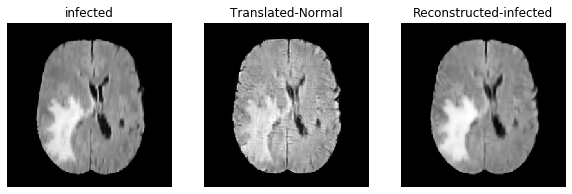

 Epoch: 63/100 | Batch: 2000/2701 | D-loss: 0.064, D-acc: 90.23% | G-loss: 2.861 | adv: 1.019 | recon: 0.039 | id: 0.016 | time: 1 day, 7:06:29.2980781

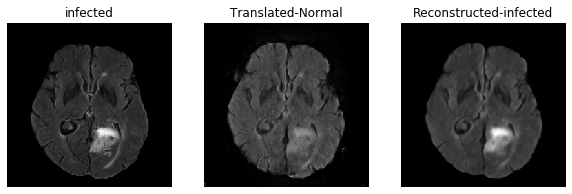

 Epoch: 64/100 | Batch: 1000/2701 | D-loss: 0.013, D-acc: 100.00% | G-loss: 2.642 | adv: 0.976 | recon: 0.033 | id: 0.017 | time: 1 day, 7:25:18.688960

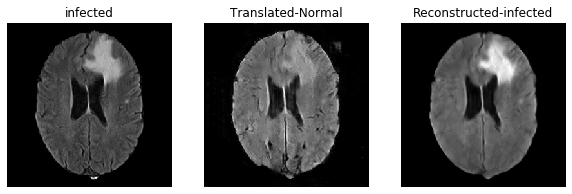

 Epoch: 64/100 | Batch: 2000/2701 | D-loss: 0.081, D-acc: 97.95% | G-loss: 3.395 | adv: 1.151 | recon: 0.049 | id: 0.080 | time: 1 day, 7:36:22.3136083

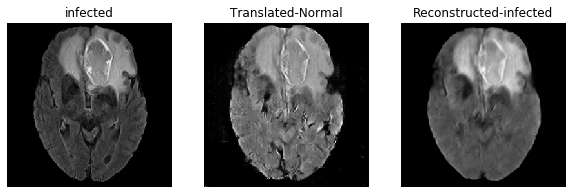

 Epoch: 65/100 | Batch: 1000/2701 | D-loss: 0.008, D-acc: 100.00% | G-loss: 2.749 | adv: 1.024 | recon: 0.033 | id: 0.018 | time: 1 day, 7:55:10.375896

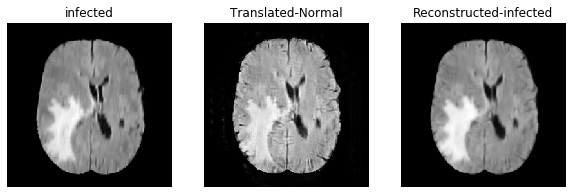

 Epoch: 65/100 | Batch: 2000/2701 | D-loss: 0.029, D-acc: 100.00% | G-loss: 2.929 | adv: 0.997 | recon: 0.045 | id: 0.018 | time: 1 day, 8:06:14.438834

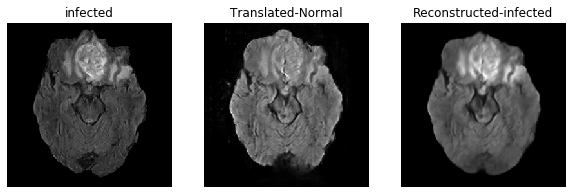

 Epoch: 66/100 | Batch: 1000/2701 | D-loss: 0.011, D-acc: 100.00% | G-loss: 2.796 | adv: 1.024 | recon: 0.036 | id: 0.018 | time: 1 day, 8:24:48.204304

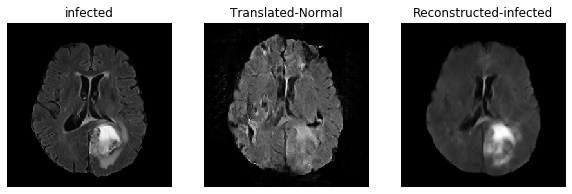

 Epoch: 66/100 | Batch: 2000/2701 | D-loss: 0.014, D-acc: 100.00% | G-loss: 2.602 | adv: 0.956 | recon: 0.033 | id: 0.017 | time: 1 day, 8:35:42.516961

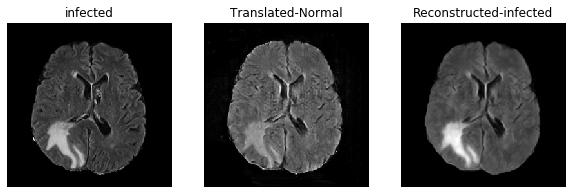

 Epoch: 67/100 | Batch: 1000/2701 | D-loss: 0.006, D-acc: 100.00% | G-loss: 2.655 | adv: 0.982 | recon: 0.033 | id: 0.016 | time: 1 day, 8:54:16.703877

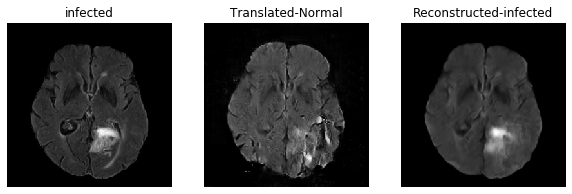

 Epoch: 67/100 | Batch: 2000/2701 | D-loss: 0.030, D-acc: 100.00% | G-loss: 3.006 | adv: 1.009 | recon: 0.044 | id: 0.020 | time: 1 day, 9:05:11.797744

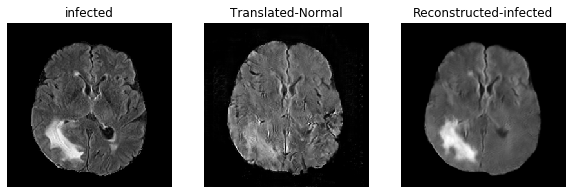

 Epoch: 68/100 | Batch: 1000/2701 | D-loss: 0.028, D-acc: 100.00% | G-loss: 3.237 | adv: 1.072 | recon: 0.052 | id: 0.035 | time: 1 day, 9:23:58.625987

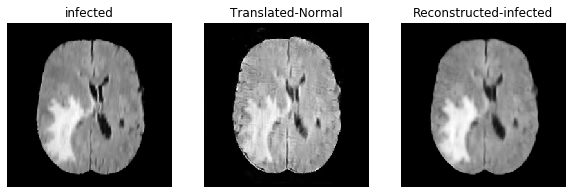

 Epoch: 68/100 | Batch: 2000/2701 | D-loss: 0.025, D-acc: 100.00% | G-loss: 3.462 | adv: 1.206 | recon: 0.049 | id: 0.039 | time: 1 day, 9:35:02.907374

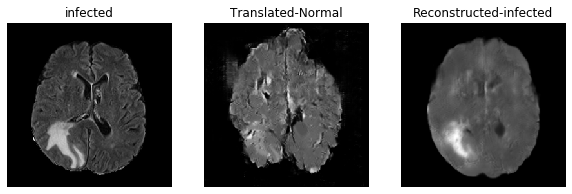

 Epoch: 69/100 | Batch: 1000/2701 | D-loss: 0.014, D-acc: 100.00% | G-loss: 2.956 | adv: 1.076 | recon: 0.036 | id: 0.044 | time: 1 day, 9:53:52.610220

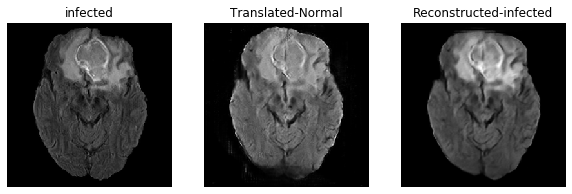

 Epoch: 69/100 | Batch: 2000/2701 | D-loss: 0.057, D-acc: 99.51% | G-loss: 2.726 | adv: 0.941 | recon: 0.039 | id: 0.043 | time: 1 day, 10:04:56.7509207

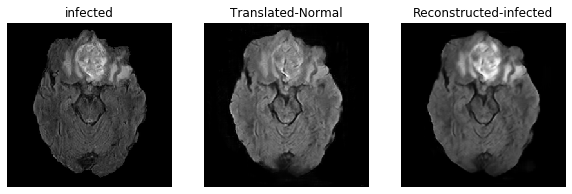

 Epoch: 70/100 | Batch: 1000/2701 | D-loss: 0.008, D-acc: 100.00% | G-loss: 2.720 | adv: 1.000 | recon: 0.034 | id: 0.015 | time: 1 day, 10:23:32.703522

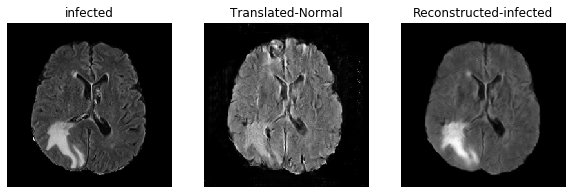

 Epoch: 70/100 | Batch: 2000/2701 | D-loss: 0.019, D-acc: 99.90% | G-loss: 2.753 | adv: 0.989 | recon: 0.037 | id: 0.017 | time: 1 day, 10:34:27.3435603

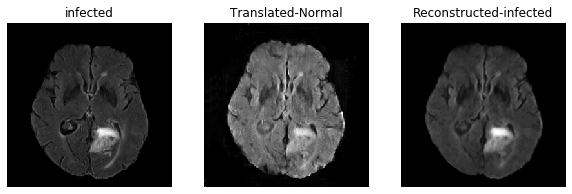

 Epoch: 71/100 | Batch: 1000/2701 | D-loss: 0.270, D-acc: 75.00% | G-loss: 2.570 | adv: 0.789 | recon: 0.048 | id: 0.017 | time: 1 day, 10:53:00.8781813

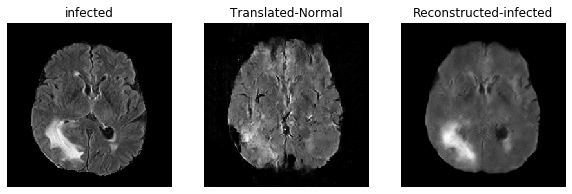

 Epoch: 71/100 | Batch: 2000/2701 | D-loss: 0.026, D-acc: 100.00% | G-loss: 2.933 | adv: 1.035 | recon: 0.039 | id: 0.043 | time: 1 day, 11:03:55.594295

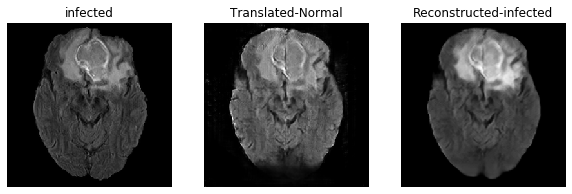

 Epoch: 72/100 | Batch: 1000/2701 | D-loss: 0.198, D-acc: 51.46% | G-loss: 2.135 | adv: 0.640 | recon: 0.041 | id: 0.017 | time: 1 day, 11:22:36.9850688

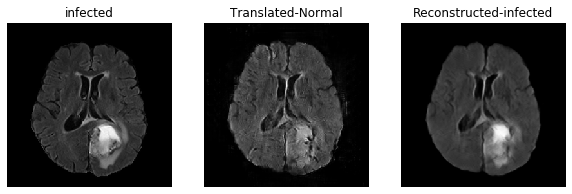

 Epoch: 72/100 | Batch: 2000/2701 | D-loss: 0.017, D-acc: 100.00% | G-loss: 2.984 | adv: 1.019 | recon: 0.046 | id: 0.015 | time: 1 day, 11:33:41.938329

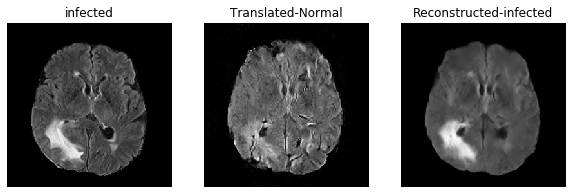

 Epoch: 73/100 | Batch: 1000/2701 | D-loss: 0.048, D-acc: 99.61% | G-loss: 3.326 | adv: 1.080 | recon: 0.053 | id: 0.077 | time: 1 day, 11:52:32.5795777

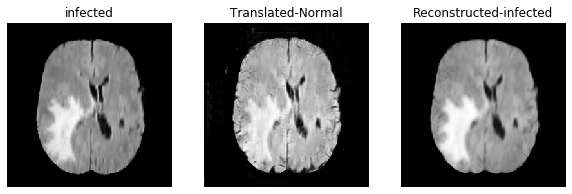

 Epoch: 73/100 | Batch: 2000/2701 | D-loss: 0.042, D-acc: 99.90% | G-loss: 3.007 | adv: 0.910 | recon: 0.057 | id: 0.024 | time: 1 day, 12:03:36.4227855

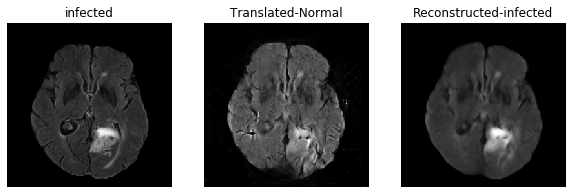

 Epoch: 74/100 | Batch: 1000/2701 | D-loss: 0.094, D-acc: 91.80% | G-loss: 3.079 | adv: 1.035 | recon: 0.047 | id: 0.043 | time: 1 day, 12:22:20.9856972

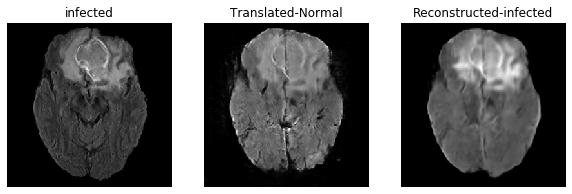

 Epoch: 74/100 | Batch: 2000/2701 | D-loss: 0.032, D-acc: 99.12% | G-loss: 2.826 | adv: 1.003 | recon: 0.040 | id: 0.014 | time: 1 day, 12:33:15.1257972

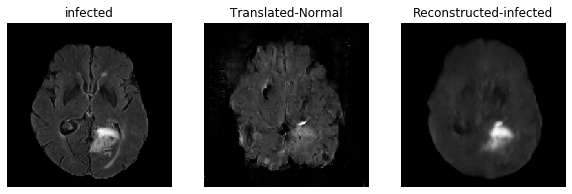

 Epoch: 75/100 | Batch: 1000/2701 | D-loss: 0.106, D-acc: 84.77% | G-loss: 3.110 | adv: 1.086 | recon: 0.045 | id: 0.023 | time: 1 day, 12:51:48.3442244

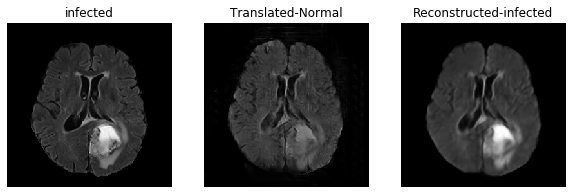

 Epoch: 75/100 | Batch: 2000/2701 | D-loss: 0.014, D-acc: 100.00% | G-loss: 3.076 | adv: 1.016 | recon: 0.048 | id: 0.060 | time: 1 day, 13:02:42.392295

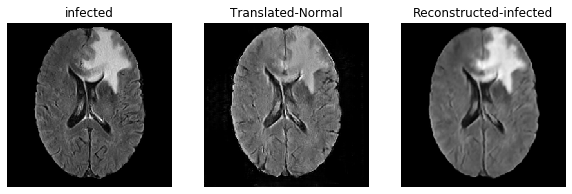

 Epoch: 76/100 | Batch: 1000/2701 | D-loss: 0.046, D-acc: 98.44% | G-loss: 3.337 | adv: 0.988 | recon: 0.054 | id: 0.032 | time: 1 day, 13:21:22.2808509

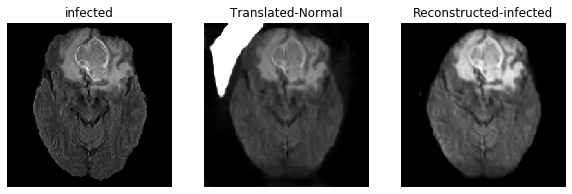

 Epoch: 76/100 | Batch: 2000/2701 | D-loss: 0.024, D-acc: 100.00% | G-loss: 2.748 | adv: 0.945 | recon: 0.040 | id: 0.020 | time: 1 day, 13:32:25.968666

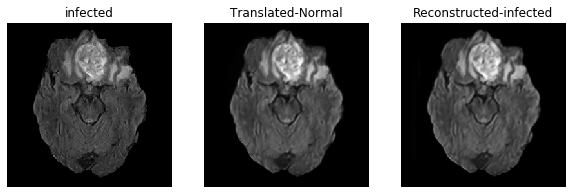

 Epoch: 77/100 | Batch: 1000/2701 | D-loss: 0.009, D-acc: 100.00% | G-loss: 2.991 | adv: 1.026 | recon: 0.042 | id: 0.025 | time: 1 day, 13:51:14.281407

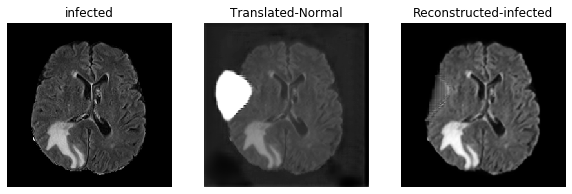

 Epoch: 77/100 | Batch: 2000/2701 | D-loss: 0.025, D-acc: 100.00% | G-loss: 2.743 | adv: 0.930 | recon: 0.042 | id: 0.021 | time: 1 day, 14:02:19.594078

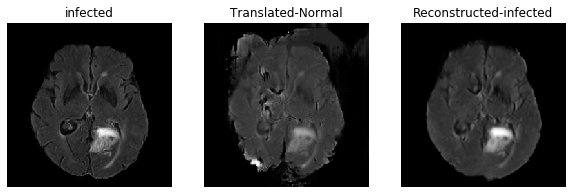

 Epoch: 78/100 | Batch: 1000/2701 | D-loss: 0.064, D-acc: 99.22% | G-loss: 2.659 | adv: 0.935 | recon: 0.037 | id: 0.023 | time: 1 day, 14:21:03.5937063

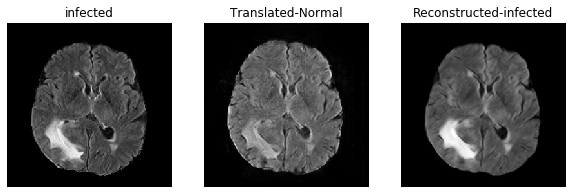

 Epoch: 78/100 | Batch: 2000/2701 | D-loss: 0.054, D-acc: 97.56% | G-loss: 3.260 | adv: 1.135 | recon: 0.048 | id: 0.018 | time: 1 day, 14:31:57.1234356

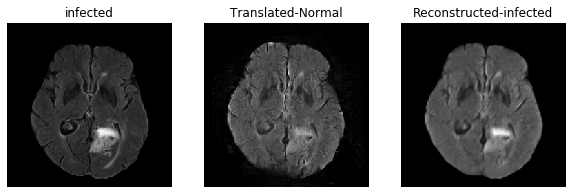

 Epoch: 79/100 | Batch: 1000/2701 | D-loss: 0.021, D-acc: 100.00% | G-loss: 3.010 | adv: 0.988 | recon: 0.049 | id: 0.021 | time: 1 day, 14:50:27.828730

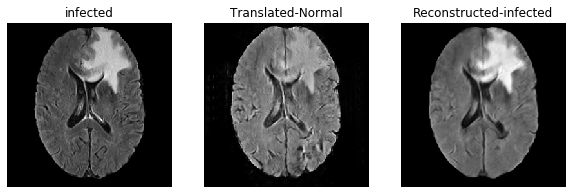

 Epoch: 79/100 | Batch: 2000/2701 | D-loss: 0.020, D-acc: 99.90% | G-loss: 2.727 | adv: 0.907 | recon: 0.042 | id: 0.036 | time: 1 day, 15:01:20.8293693

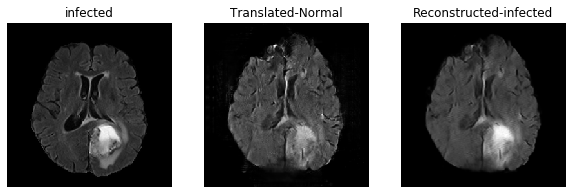

 Epoch: 80/100 | Batch: 1000/2701 | D-loss: 0.022, D-acc: 100.00% | G-loss: 3.473 | adv: 1.124 | recon: 0.056 | id: 0.062 | time: 1 day, 15:20:04.172573

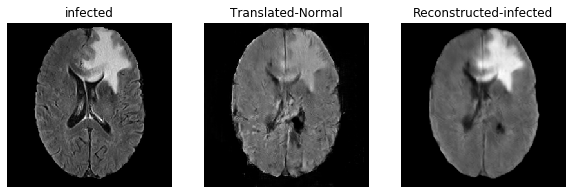

 Epoch: 80/100 | Batch: 2000/2701 | D-loss: 0.028, D-acc: 99.90% | G-loss: 2.744 | adv: 1.019 | recon: 0.033 | id: 0.020 | time: 1 day, 15:31:08.0950603

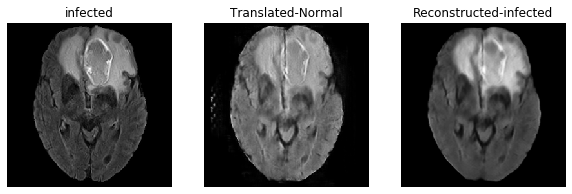

 Epoch: 81/100 | Batch: 1000/2701 | D-loss: 0.008, D-acc: 100.00% | G-loss: 2.596 | adv: 1.024 | recon: 0.026 | id: 0.017 | time: 1 day, 15:49:57.532115

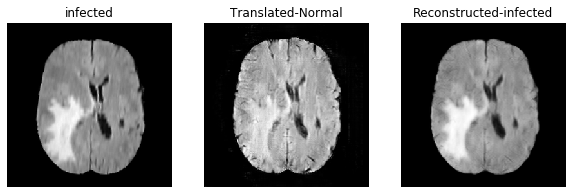

 Epoch: 81/100 | Batch: 2000/2701 | D-loss: 0.048, D-acc: 99.90% | G-loss: 2.818 | adv: 0.971 | recon: 0.042 | id: 0.019 | time: 1 day, 16:01:00.6742522

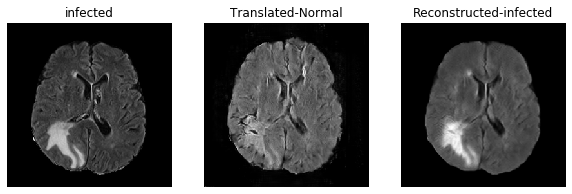

 Epoch: 82/100 | Batch: 1000/2701 | D-loss: 0.015, D-acc: 100.00% | G-loss: 2.848 | adv: 0.997 | recon: 0.040 | id: 0.026 | time: 1 day, 16:19:37.032934

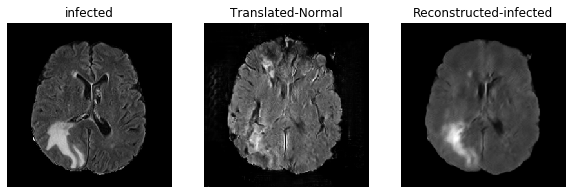

 Epoch: 82/100 | Batch: 2000/2701 | D-loss: 0.006, D-acc: 100.00% | G-loss: 2.685 | adv: 1.013 | recon: 0.031 | id: 0.012 | time: 1 day, 16:30:29.624693

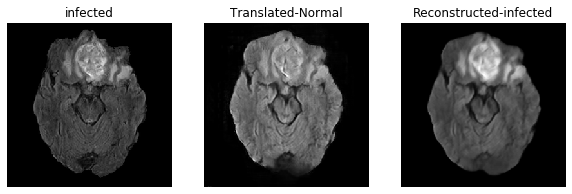

 Epoch: 83/100 | Batch: 1000/2701 | D-loss: 0.008, D-acc: 100.00% | G-loss: 2.901 | adv: 1.028 | recon: 0.040 | id: 0.012 | time: 1 day, 16:49:00.595972

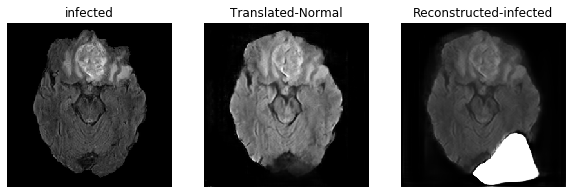

 Epoch: 83/100 | Batch: 2000/2701 | D-loss: 0.013, D-acc: 100.00% | G-loss: 2.885 | adv: 1.039 | recon: 0.039 | id: 0.018 | time: 1 day, 16:59:52.906830

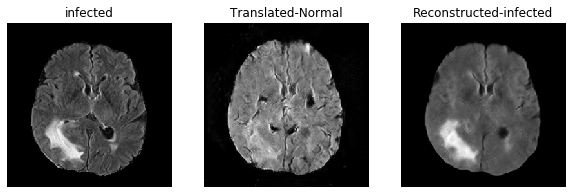

 Epoch: 84/100 | Batch: 1000/2701 | D-loss: 0.019, D-acc: 100.00% | G-loss: 2.891 | adv: 1.015 | recon: 0.041 | id: 0.020 | time: 1 day, 17:18:26.579830

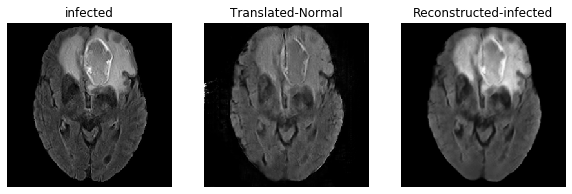

 Epoch: 84/100 | Batch: 2000/2701 | D-loss: 0.017, D-acc: 100.00% | G-loss: 2.873 | adv: 1.002 | recon: 0.041 | id: 0.036 | time: 1 day, 17:29:29.157650

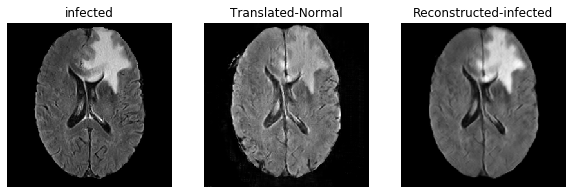

 Epoch: 85/100 | Batch: 1000/2701 | D-loss: 0.069, D-acc: 88.77% | G-loss: 2.868 | adv: 0.903 | recon: 0.051 | id: 0.022 | time: 1 day, 17:48:14.4375560

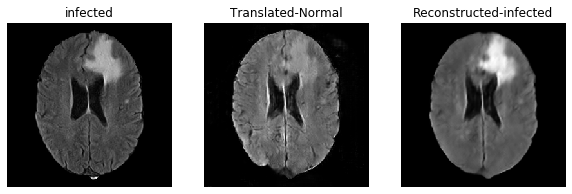

 Epoch: 85/100 | Batch: 2000/2701 | D-loss: 0.047, D-acc: 99.80% | G-loss: 2.620 | adv: 0.908 | recon: 0.039 | id: 0.014 | time: 1 day, 17:59:16.9403115

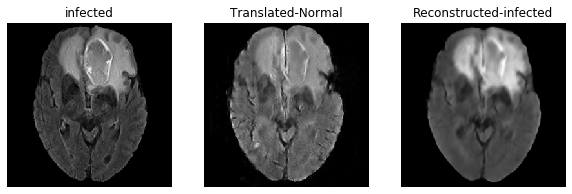

 Epoch: 86/100 | Batch: 1000/2701 | D-loss: 0.091, D-acc: 86.52% | G-loss: 3.858 | adv: 1.005 | recon: 0.090 | id: 0.022 | time: 1 day, 18:17:59.6718916

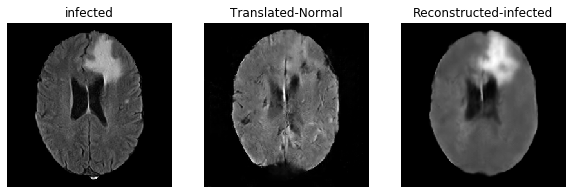

 Epoch: 86/100 | Batch: 2000/2701 | D-loss: 0.022, D-acc: 98.54% | G-loss: 3.176 | adv: 0.988 | recon: 0.057 | id: 0.025 | time: 1 day, 18:28:51.9689968

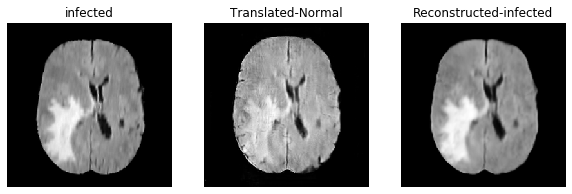

 Epoch: 87/100 | Batch: 1000/2701 | D-loss: 0.028, D-acc: 100.00% | G-loss: 3.264 | adv: 1.070 | recon: 0.054 | id: 0.019 | time: 1 day, 18:47:22.110020

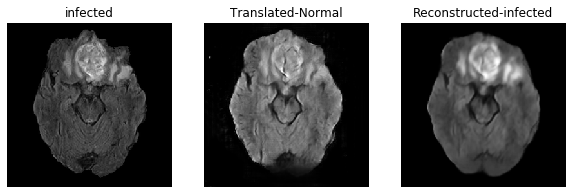

 Epoch: 87/100 | Batch: 2000/2701 | D-loss: 0.103, D-acc: 97.95% | G-loss: 2.388 | adv: 0.670 | recon: 0.050 | id: 0.019 | time: 1 day, 18:58:14.2980610

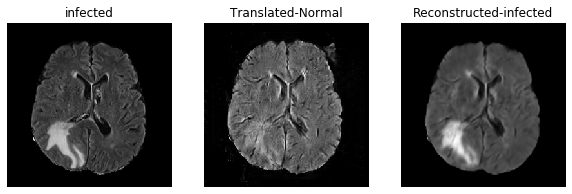

 Epoch: 88/100 | Batch: 1000/2701 | D-loss: 0.066, D-acc: 97.46% | G-loss: 3.155 | adv: 0.989 | recon: 0.057 | id: 0.021 | time: 1 day, 19:16:45.2975067

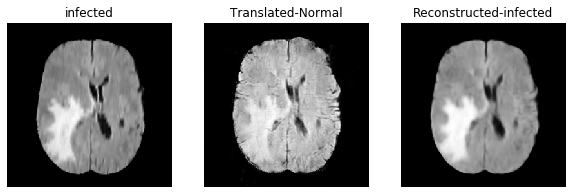

 Epoch: 88/100 | Batch: 2000/2701 | D-loss: 0.028, D-acc: 99.80% | G-loss: 3.172 | adv: 1.061 | recon: 0.050 | id: 0.022 | time: 1 day, 19:27:45.8286891

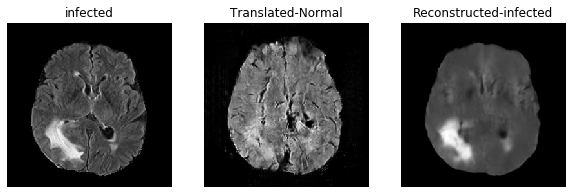

 Epoch: 89/100 | Batch: 1000/2701 | D-loss: 0.027, D-acc: 100.00% | G-loss: 3.098 | adv: 1.011 | recon: 0.052 | id: 0.014 | time: 1 day, 19:46:32.594331

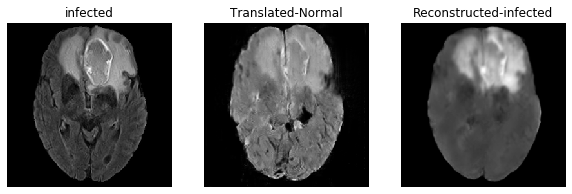

 Epoch: 89/100 | Batch: 2000/2701 | D-loss: 0.014, D-acc: 100.00% | G-loss: 3.228 | adv: 0.971 | recon: 0.061 | id: 0.030 | time: 1 day, 19:57:35.141287

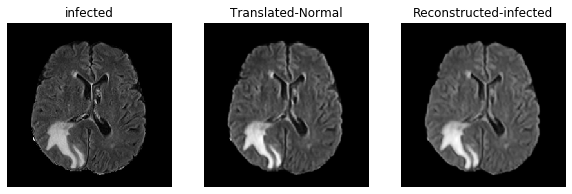

 Epoch: 90/100 | Batch: 1000/2701 | D-loss: 0.099, D-acc: 86.04% | G-loss: 3.479 | adv: 1.154 | recon: 0.056 | id: 0.018 | time: 1 day, 20:16:18.9703395

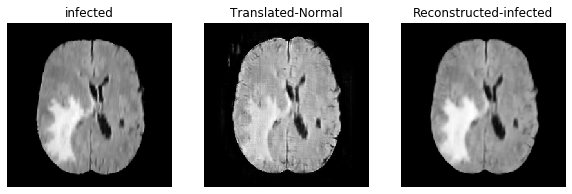

 Epoch: 90/100 | Batch: 2000/2701 | D-loss: 0.040, D-acc: 100.00% | G-loss: 3.056 | adv: 1.013 | recon: 0.050 | id: 0.015 | time: 1 day, 20:27:11.032064

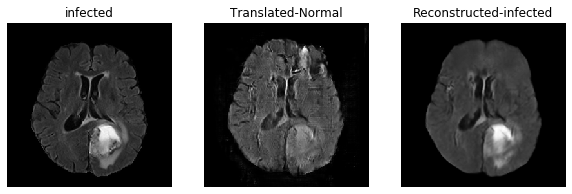

 Epoch: 91/100 | Batch: 1000/2701 | D-loss: 0.022, D-acc: 100.00% | G-loss: 2.855 | adv: 0.963 | recon: 0.045 | id: 0.019 | time: 1 day, 20:45:41.141743

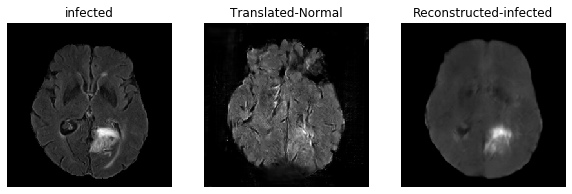

 Epoch: 91/100 | Batch: 2000/2701 | D-loss: 0.016, D-acc: 100.00% | G-loss: 2.917 | adv: 0.941 | recon: 0.050 | id: 0.019 | time: 1 day, 20:56:33.141850

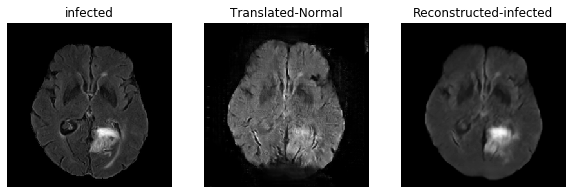

 Epoch: 92/100 | Batch: 1000/2701 | D-loss: 0.009, D-acc: 100.00% | G-loss: 3.387 | adv: 1.047 | recon: 0.063 | id: 0.020 | time: 1 day, 21:15:10.297422

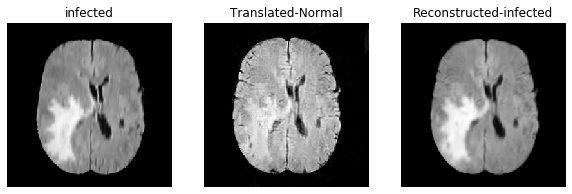

 Epoch: 92/100 | Batch: 2000/2701 | D-loss: 0.019, D-acc: 100.00% | G-loss: 3.166 | adv: 0.998 | recon: 0.055 | id: 0.050 | time: 1 day, 21:26:11.578861

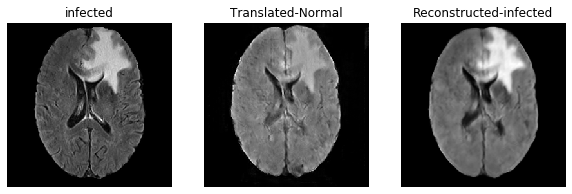

 Epoch: 93/100 | Batch: 1000/2701 | D-loss: 0.014, D-acc: 100.00% | G-loss: 2.786 | adv: 0.976 | recon: 0.039 | id: 0.036 | time: 1 day, 21:44:57.547790

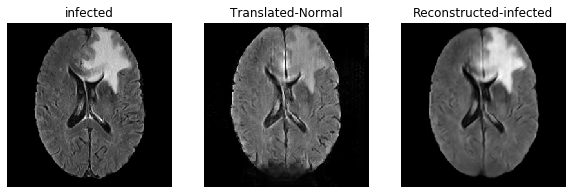

 Epoch: 93/100 | Batch: 2000/2701 | D-loss: 0.010, D-acc: 100.00% | G-loss: 2.878 | adv: 0.978 | recon: 0.044 | id: 0.017 | time: 1 day, 21:55:59.125840

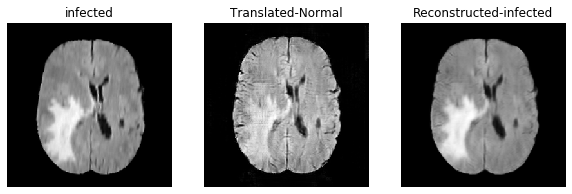

 Epoch: 94/100 | Batch: 1000/2701 | D-loss: 0.039, D-acc: 100.00% | G-loss: 3.194 | adv: 1.044 | recon: 0.053 | id: 0.018 | time: 1 day, 22:14:37.203632

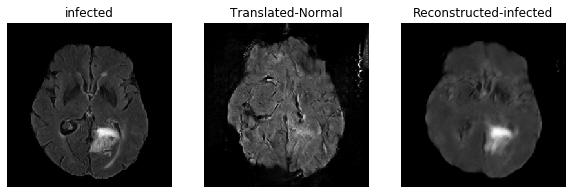

 Epoch: 94/100 | Batch: 2000/2701 | D-loss: 0.037, D-acc: 100.00% | G-loss: 3.021 | adv: 1.065 | recon: 0.043 | id: 0.021 | time: 1 day, 22:25:28.548803

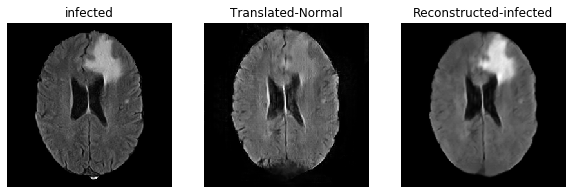

 Epoch: 95/100 | Batch: 1000/2701 | D-loss: 0.007, D-acc: 100.00% | G-loss: 3.098 | adv: 1.078 | recon: 0.045 | id: 0.016 | time: 1 day, 22:43:58.699611

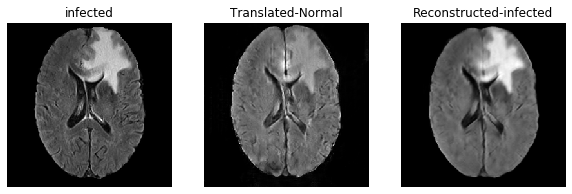

 Epoch: 95/100 | Batch: 2000/2701 | D-loss: 0.032, D-acc: 100.00% | G-loss: 3.144 | adv: 1.002 | recon: 0.055 | id: 0.021 | time: 1 day, 22:54:49.687667

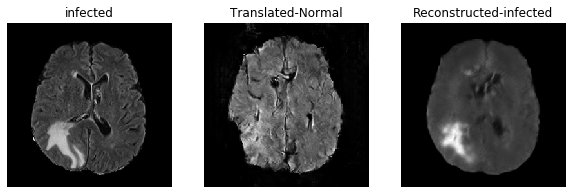

 Epoch: 96/100 | Batch: 1000/2701 | D-loss: 0.035, D-acc: 99.80% | G-loss: 3.051 | adv: 1.092 | recon: 0.041 | id: 0.021 | time: 1 day, 23:13:24.3761985

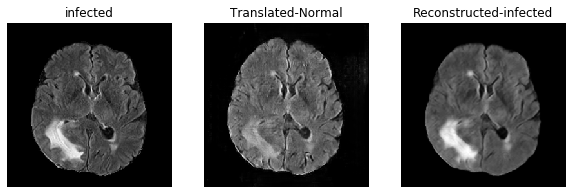

 Epoch: 96/100 | Batch: 2000/2701 | D-loss: 0.050, D-acc: 99.80% | G-loss: 3.150 | adv: 1.050 | recon: 0.050 | id: 0.018 | time: 1 day, 23:24:26.7509038

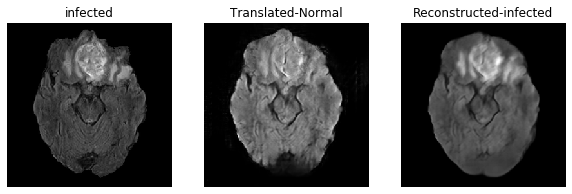

 Epoch: 97/100 | Batch: 1000/2701 | D-loss: 0.031, D-acc: 100.00% | G-loss: 3.071 | adv: 0.914 | recon: 0.060 | id: 0.020 | time: 1 day, 23:43:13.047507

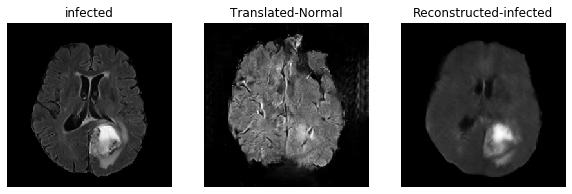

 Epoch: 97/100 | Batch: 2000/2701 | D-loss: 0.008, D-acc: 100.00% | G-loss: 3.281 | adv: 0.974 | recon: 0.062 | id: 0.073 | time: 1 day, 23:54:15.532811

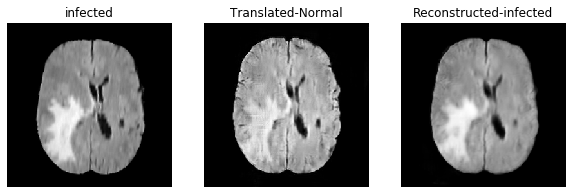

 Epoch: 98/100 | Batch: 1000/2701 | D-loss: 0.035, D-acc: 99.22% | G-loss: 3.150 | adv: 1.079 | recon: 0.047 | id: 0.023 | time: 2 days, 0:12:54.4845663

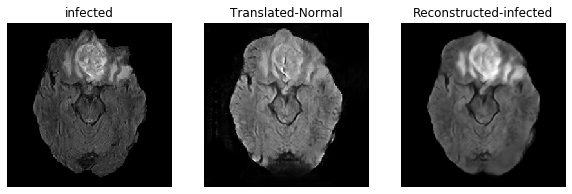

 Epoch: 98/100 | Batch: 2000/2701 | D-loss: 0.013, D-acc: 100.00% | G-loss: 2.852 | adv: 0.963 | recon: 0.044 | id: 0.016 | time: 2 days, 0:23:46.063028

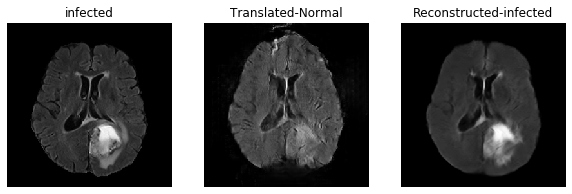

 Epoch: 99/100 | Batch: 1000/2701 | D-loss: 0.013, D-acc: 100.00% | G-loss: 2.977 | adv: 1.042 | recon: 0.043 | id: 0.018 | time: 2 days, 0:42:15.922194

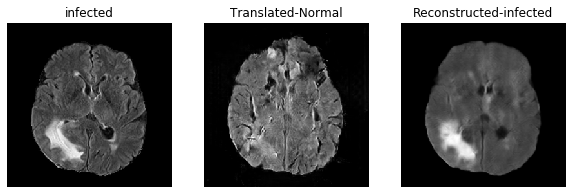

 Epoch: 99/100 | Batch: 2000/2701 | D-loss: 0.024, D-acc: 100.00% | G-loss: 3.138 | adv: 0.948 | recon: 0.060 | id: 0.015 | time: 2 days, 0:53:08.594438

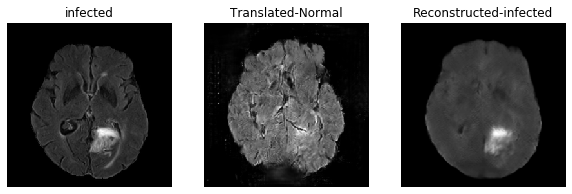

 Epoch: 100/100 | Batch: 1000/2701 | D-loss: 0.048, D-acc: 98.05% | G-loss: 3.317 | adv: 1.131 | recon: 0.051 | id: 0.022 | time: 2 days, 1:11:41.656272

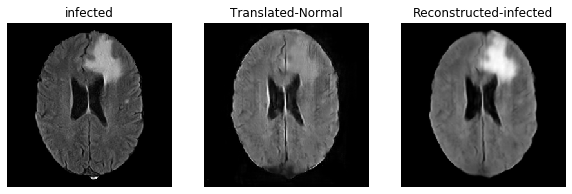

 Epoch: 100/100 | Batch: 2000/2701 | D-loss: 0.036, D-acc: 99.80% | G-loss: 3.125 | adv: 1.121 | recon: 0.042 | id: 0.016 | time: 2 days, 1:22:43.0165179

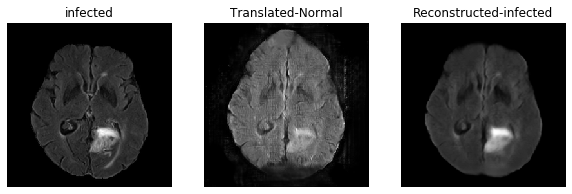

 Epoch: 100/100 | Batch: 2701/2701 | D-loss: 0.021, D-acc: 100.00% | G-loss: 2.914 | adv: 0.909 | recon: 0.053 | id: 0.021 | time: 2 days, 1:30:26.594986

In [0]:
import datetime
import matplotlib.pyplot as plt
import sys
import random
import numpy as np
import os
from keras.preprocessing.image import load_img

os.chdir('/content/drive/My Drive/GitHub Repositories')
baseDir = './Research Paper Contribution/Cascaded Model/BRATS'

modelDir = os.path.join(baseDir, 'saved models', 'Step 1')
if not os.path.exists(modelDir):
    os.makedirs(modelDir)
    print('Model Directory Created to save Results')

trainDir = os.path.join(baseDir, 'dataset', 'train')
validDir = os.path.join(baseDir, 'dataset', 'test')

infected_imgs = np.load(os.path.join(trainDir, 'infected_images.npy'), mmap_mode='r')
print('Domain A Images : {}'.format(infected_imgs.shape))
normal_imgs = np.load(os.path.join(trainDir, 'normal_images.npy'), mmap_mode='r')
print('Domain B Images: {}'.format(normal_imgs.shape))



start_time = datetime.datetime.now()
epochs = 100
batch_size = 1
batches=int(min(infected_imgs.shape[0], normal_imgs.shape[0])/batch_size)
save_interval = 1000

# Adversarial loss ground truths
valid = np.ones((batch_size,) + disc_patch)
fake = np.zeros((batch_size,) + disc_patch)




def save_imgs(epoch, batch):
  # pick random image from test data based on random indexes and reshape the image to tensor
  pickrandomInfectedImage = random.choice(os.listdir(os.path.join(validDir, 'infected')))
  imgs_A = np.asarray(load_img(os.path.join(validDir, 'infected', pickrandomInfectedImage), color_mode="grayscale"))
  imgs_A = imgs_A / 127.5 - 1
  imgs_A = imgs_A.reshape(-1, img_rows, img_cols, channels)

  # Translate images to opposite domain
  fake_B = G_AB.predict(imgs_A)
  
  # Translate back to original domain
  reconstr_A = G_BA.predict(fake_B)

  gen_imgs = np.concatenate([imgs_A, fake_B, reconstr_A])

  # Rescale images 0 - 1
  gen_imgs = 0.5 * gen_imgs + 0.5

  titles = ['infected', 'Translated-Normal', 'Reconstructed-infected',]
  fig=plt.figure(1, figsize=(10, 10))
  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.imshow(gen_imgs[i,..., 0], cmap='gray')
    plt.gca().set_title(titles[i])
    plt.axis('off')
  plt.show()
  # fig.savefig(outputDir+'/image_at_epoch_{:04d}_batch_{:04d}.png'.format(epoch, batch))
  plt.close()

# Training 
for epoch in range(epochs):
  epoch+=1
  for batch in range(batches):
    batch+=1
    # ----------------------
    #  Train Discriminators
    # ----------------------

    # pick random image from training data based on random indexes and reshape the image to tensor
    random_index = random.randint(0, infected_imgs.shape[0]-1)
    imgs_A = infected_imgs[random_index]
    imgs_A = imgs_A.reshape(-1, img_rows, img_cols, channels)

    random_index = random.randint(0, normal_imgs.shape[0]-1)
    imgs_B = normal_imgs[random_index]
    imgs_B = imgs_B.reshape(-1, img_rows, img_cols, channels)


    # Translate images to opposite domain
    fake_B = G_AB.predict(imgs_A)
    fake_A = G_BA.predict(imgs_B)
    
    # Train the discriminators (original images = real / translated = Fake)
    dA_loss_real = D_A.train_on_batch(imgs_A, valid)
    dA_loss_fake = D_A.train_on_batch(fake_A, fake)
    dA_loss = 0.5 * np.add(dA_loss_real, dA_loss_fake)

    dB_loss_real = D_B.train_on_batch(imgs_B, valid)
    dB_loss_fake = D_B.train_on_batch(fake_B, fake)
    dB_loss = 0.5 * np.add(dB_loss_real, dB_loss_fake)

    # Total disciminator loss
    d_loss = 0.5 * np.add(dA_loss, dB_loss)
    
    # ------------------
    #  Train Generators
    # ------------------

    # Train the generators
    g_loss = combined.train_on_batch([imgs_A, imgs_B], [valid, valid, imgs_A, imgs_B, imgs_A, imgs_B])

    elapsed_time = datetime.datetime.now() - start_time
    sys.stdout.write('\r Epoch: {0}/{1} | Batch: {2}/{3} | D-loss: {4:.3f}, D-acc: {5:.2f}% | G-loss: {6:.3f} | adv: {7:.3f} | recon: {8:.3f} | id: {9:.3f} | time: {10}'.
                     format(epoch, epochs, batch, batches, d_loss[0], 100*d_loss[1], g_loss[0], np.mean(g_loss[1:3]), np.mean(g_loss[3:5]),
                            np.mean(g_loss[5:6]), elapsed_time))
    # After specific number of iterations say 200 in our case save results
    # If at save interval => save generated image samples
    if batch % save_interval == 0:
      save_imgs(epoch, batch)

  modelsaveDir = os.path.join(modelDir, 'Epoch_{}'.format(epoch))
  if not os.path.exists(modelsaveDir):
    os.makedirs(modelsaveDir)

  G_AB.save(os.path.join(modelsaveDir, 'G_infected2normal.h5'))
  G_BA.save(os.path.join(modelsaveDir, 'G_normal2infected.h5'))



**Load the Best Saved Model and Generate Normal Images against Each Infected Image to get Pairs**

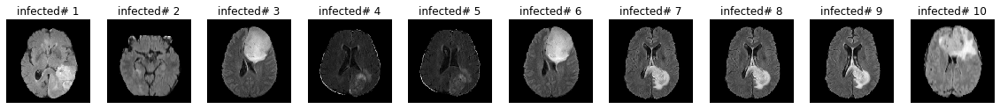

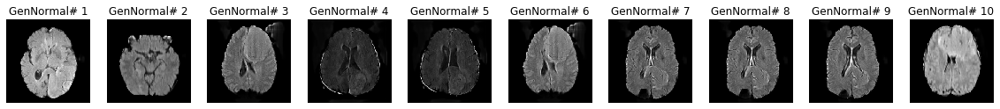

In [4]:
import os
from keras.models import load_model
from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization

from keras.preprocessing.image import load_img, img_to_array, save_img
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings("ignore")

img_rows = 256
img_cols = 256
channels = 1

os.chdir('/content/drive/My Drive/GitHub Repositories')
baseDir = './Research Paper Contribution/Cascaded Model/BRATS Data'

trainDir = os.path.join(baseDir, 'dataset', 'train')
infectedImgs = np.load(os.path.join(trainDir, 'infected_images.npy'), mmap_mode='r')


def plotResults(infectedImgs, normalImgs):
  normalImgs = 0.5 * normalImgs + 0.5
  infectedImgs = 0.5 * infectedImgs + 0.5

  plt.figure(1, figsize=(20,20))
  for i in range(infectedImgs.shape[0]):
    plt.subplot(1, infectedImgs.shape[0], i+1).set_title('infected# {}' .format(i+1))
    plt.imshow(infectedImgs[i, :, :, 0], cmap='gray')
    plt.axis('off')
  plt.figure(2, figsize=(20,20))
  for i in range(normalImgs.shape[0]):
    plt.subplot(1, normalImgs.shape[0], i+1).set_title('GenNormal# {}' .format(i+1))
    plt.imshow(normalImgs[i, :, :, 0], cmap='gray')
    plt.axis('off')
  plt.show()
  plt.close()

G = load_model(os.path.join(baseDir, 'saved models', 'Step 1', 'Best Epoch Model', 'G_infected2normal.h5'), custom_objects={'InstanceNormalization': InstanceNormalization})
normalImgs = G.predict(infectedImgs)
np.save(os.path.join(trainDir, 'generated-normal_images'), normalImgs)
plotResults(infectedImgs[:10], normalImgs[:10])
